## Utilities

In [1]:
# pip install corner
# pip install tables

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import corner 
# import h5py

from data.dataLoader import h5_data_loader
from PCAutil.utilities import loading_matrix, biplot


#Some colors that Pablo likes:
colors = [
    "#ff7f0e",

    "#1f77b4",

    "#2ca02c",
    "#d62728",
    
    "#9467bd",
    "#8c564b",
    "#e377c2",
    "#7f7f7f",
    "#bcbd22",
    "#17becf",
    '#1f77b4',  # muted blue
    'r',  
] 
colors_models = [
    'red',
    'blue',
    'green',
    'purple',
    'orange',
    'cyan',
    'magenta',
    'lime',
    'pink',
    'yellow',
    '#1f77b4',  # muted blue
    '#ff7f0e',  # safety orange
    '#2ca02c',  # cooked asparagus green
    '#d62728',  # brick red
    '#9467bd'   # muted purple
]

markers = [
    "o",  # Circle
    "^",  # Triangle up
    "s",  # Square
    "P",  # Plus (filled)
    "*",  # Star
    "X",  # X (filled)
    "D",  # Diamond
    "H",  # Hexagon
]




#Number used for when dividing training and testing randomly uniformly (interpolating)
TestingFraction=0.34

#Number used for when dividing training and testing by how close they are to the stable nuclei
distance=2



#Target nucleus: 
target_isotope=np.array([32,20])


#Coordinates to truncate so the LDM evaluations are not done below these isotopes
minimumZ=8
minimumN=8



centering_data=True
stable_coordinates_full=np.loadtxt("Stable-Isotopes.txt")

## Preparing the real data

### I am not using the dataLoader.py because I couldn't make it work

In [3]:
models = ['AME2020', 'ME2', 'MEdelta', 'PC1', 'NL3S', 'SKMS', 'SKP', 'SLY4', 'SV', 'UNEDF0', \
        'UNEDF1', 'UNEDF2', 'FRDM12', 'HFB24', 'BCPM', 'D1M']

models_data_sets={}
# models_data_sets=[]

for model in models:
        Data_values=pd.read_hdf("./data/selected_data.h5", key = model, mode = 'r')
        # models_data_sets[model]= {'N': Data_values['N'] , 'Z': Data_values['Z'], 'BE': Data_values['BE']}
        # models_data_sets.append(Data_values[['N','Z','BE']])
        models_data_sets[model] = Data_values[['N','Z','BE']]
        
    

In [4]:
for model in models:
    print(model, len(models_data_sets[model]['N']))

AME2020 2548
ME2 654
MEdelta 654
PC1 654
NL3S 656
SKMS 2459
SKP 2485
SLY4 2479
SV 2484
UNEDF0 2484
UNEDF1 2495
UNEDF2 2540
FRDM12 2457
HFB24 2457
BCPM 2525
D1M 2524


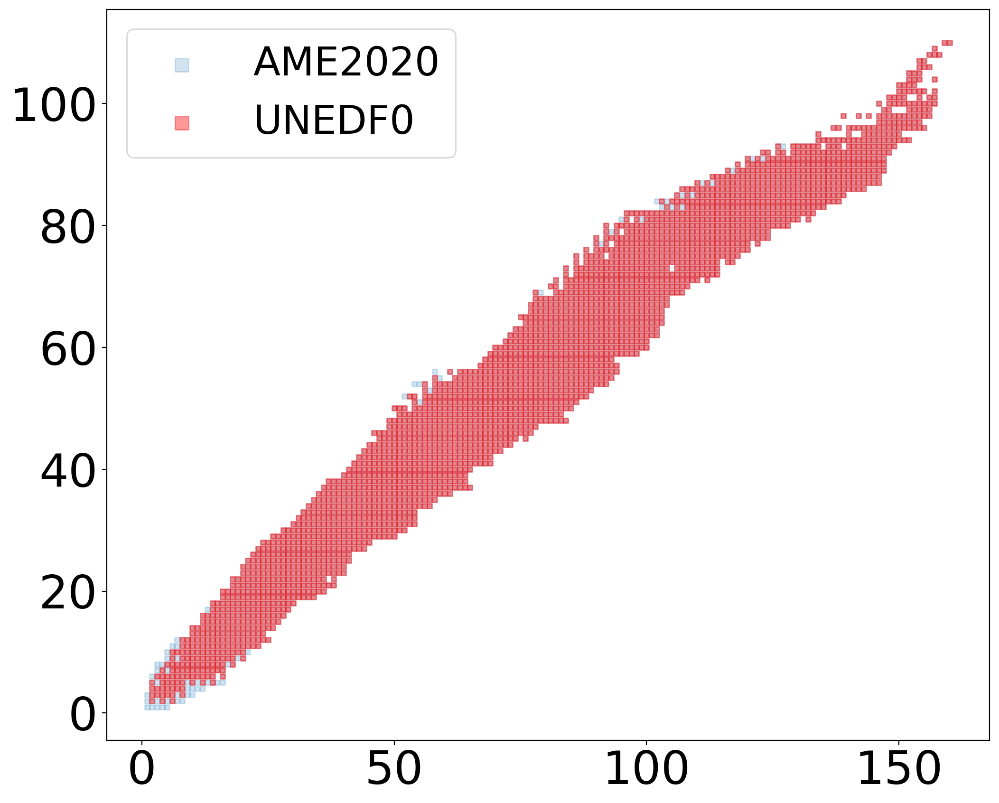

In [5]:
plt.rc("xtick", labelsize=35)
plt.rc("ytick", labelsize=35)

fig, ax = plt.subplots(figsize=(12,10), dpi=200)

ax.scatter(x = models_data_sets['AME2020']['N'], y = models_data_sets['AME2020']['Z'], label = "AME2020", alpha = 0.2,s=11,marker="s")

model=models[9]
ax.scatter(x = models_data_sets[model]['N'], y = models_data_sets[model]['Z'], label = model, alpha = 0.4,s=11,marker="s",color='r')




# ax.scatter(x = stable_coordinates_full.T[0], y = stable_coordinates_full.T[1], label = "Stable", alpha = 0.8,color='black',s=11,marker="s")







# plt.ylabel("Protons",fontsize=45)
plt.legend(fontsize=30,markerscale=3)
plt.show()

In [6]:
models_selected=['AME2020', 'SKMS', 'SKP', 'SLY4', 'SV', 'UNEDF0', \
        'UNEDF1', 'UNEDF2', 'FRDM12', 'HFB24', 'BCPM', 'D1M']  #Selecting models that have predictions beyond even even nuclei

In [7]:
filtered_NZ=np.array([models_data_sets[models_selected[0]]['N'].tolist(),models_data_sets[models_selected[0]]['Z'].tolist()]).T

In [8]:
filtered_NZ_new=[]  #filtering N and Z to lay beyond the minimum selected value (oxygen 16)
for isotope in filtered_NZ:
    if (isotope[0]>=minimumN) & (isotope[1]>=minimumZ):
        filtered_NZ_new.append(isotope)

filtered_NZ=np.copy(np.array(filtered_NZ_new))

In [9]:
len(filtered_NZ)

2457

In [10]:
for model in models_selected:  #filtering N and Z so that we have a common set for all the models
    filtered_NZ_new=[]
    for isotope in filtered_NZ:
        if ((models_data_sets[model]['N'] == isotope[0]) & (models_data_sets[model]['Z'] == isotope[1])).any():
            filtered_NZ_new.append(isotope)

    filtered_NZ=np.copy(np.array(filtered_NZ_new))

In [11]:
len(filtered_NZ)

2392

In [12]:
filtered_NZ_df=pd.DataFrame({'N':filtered_NZ.T[0] ,'Z':filtered_NZ.T[1] })

In [13]:
selected_models_data_sets=pd.DataFrame(filtered_NZ_df)


for model in models_selected:

        data_model = models_data_sets[model].merge(filtered_NZ_df, on=['N','Z'],how='inner')
        selected_models_data_sets[model] = data_model['BE']

In [14]:
selected_models_data_sets

,N,Z,AME2020,SKMS,SKP,SLY4,SV,UNEDF0,UNEDF1,UNEDF2,FRDM12,HFB24,BCPM,D1M
0,8,8,127.619315,128.856436,128.904993,129.839429,127.368236,126.708495,121.705460,121.950687,128.03,125.632422,127.007944,128.028806
1,9,8,131.762395,134.453145,134.216195,134.465768,132.248686,132.466675,126.874772,126.724679,132.45,129.683740,132.663355,132.855739
2,10,8,139.807766,144.746257,144.484846,144.734392,141.963546,142.040342,136.123181,136.259511,141.84,138.095058,141.145503,141.000517
3,11,8,143.763409,149.520233,148.479671,148.218079,145.832250,146.442291,140.252157,140.281128,144.95,141.946376,145.709590,144.734930
4,12,8,151.371414,158.460613,156.849135,156.488630,153.746333,154.121072,147.620242,148.128389,152.98,151.927694,153.041593,151.904718
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2387,156,108,1926.771317,1911.680941,1918.341803,1916.133844,1919.723353,1925.454882,1926.206982,1926.326995,1927.52,1926.745956,1922.608355,1918.524169
2388,157,108,1933.505561,1919.284649,1924.964857,1923.113154,1926.824461,1932.545073,1933.204636,1933.279003,1934.33,1933.867274,1929.496935,1925.226253
2389,158,108,1941.337453,1927.231556,1933.157370,1930.669126,1934.554087,1940.259078,1940.812152,1940.991163,1942.52,1941.618592,1937.508145,1933.626547
2390,159,110,1950.291722,1934.845239,1941.544224,1939.679007,1943.394022,1949.400326,1950.026255,1949.971435,1951.94,1950.857879,1946.396044,1942.165960


## Now that the data is prepared, we continue in a very similar way as the LDM-notebook 

In [15]:
#Some functions for plotting capabilities

def plot_bars(values, labels, title="Bar Plot", color='blue'):
    """
    Create a bar plot based on the provided values and labels.

    Parameters:
    - values (list): A list of numerical values for the bars.
    - labels (list): A list of labels for each bar.
    - title (str): The title for the bar plot. Default is "Bar Plot".
    - color (str): Color for the bars. Default is 'blue'.
    """
    
    if len(values) != len(labels):
        raise ValueError("Length of values and labels should be the same.")
    
    plt.figure(figsize=(10, 5))
    plt.bar(labels, values, color=color)
    plt.title(title)
    plt.xlabel('Models')
    plt.ylabel('Vt Coordinates')
    plt.xticks(labels,fontsize=10,rotation='vertical')
    plt.grid(axis='y')
    plt.tight_layout()
    plt.show()


def Plotter2D_single(data):
    xvals,yvals,zvals = data
    #A plotter to see principal components in 2D
    plt.rc("xtick", labelsize=25)
    plt.rc("ytick", labelsize=25)
    
    fig, ax = plt.subplots(figsize=(12, 8), dpi=200)

    # Create scatter plot
    sc = ax.scatter(xvals, yvals, c=zvals, s=25, cmap='plasma',marker='s')
    # plt.colorbar(sc, label='Z-Value')
    cbar = plt.colorbar(sc, ax=ax)
    cbar.set_label('Z-Value', fontsize=25) 
    cbar.ax.tick_params(labelsize=20) 
    plt.xlabel('Neutrons',fontsize=25)
    plt.ylabel('Protons',fontsize=25)

    ax.grid(True)
    # ax.axis('equal')

    plt.show()

def Plotter3D_single(data,elev=30,azim=-60):
    xvals,yvals,zvals = data
    #A plotter to see principal components in 3D
    plt.rc("xtick", labelsize=15)
    plt.rc("ytick", labelsize=15)

    z_min = zvals.min()
    z_max = zvals.max()
    z_normalized = (zvals - z_min) / (z_max - z_min)

    # Create figure for 3D plot
    fig = plt.figure(figsize=(8, 6), dpi=200)
    ax = fig.add_subplot(111, projection='3d')



    # Define the size of the bars
    dx = dy = 1.5  # Width of the bars in the x and y direction
    dz = z_normalized        # Height of the bars (z values)

    # Create 3D bar plot
    ax.bar3d(xvals, yvals, np.zeros_like(zvals), dx, dy, dz, color=plt.cm.plasma(z_normalized))

    ax.view_init(elev=elev, azim=azim) 

    # Setting labels and title
    ax.set_xlabel('Neutrons')
    ax.set_ylabel('Protons')
    ax.set_zlabel('Scaled Z')


    plt.show()    



def Plotter2D(ax,xvals,yvals,zvals):
    #A plotter to see principal components in 2D, part of the big plotter



    # Create scatter plot
    sc = ax.scatter(xvals, yvals, c=zvals, s=25, cmap='plasma',marker='s')
    # plt.colorbar(sc, label='Z-Value')
    cbar = plt.colorbar(sc, ax=ax)
    cbar.set_label('Z-Value', fontsize=25) 
    cbar.ax.tick_params(labelsize=20) 




    plt.xlabel('Neutrons',fontsize=25)
    plt.ylabel('Protons',fontsize=25)

    ax.grid(True)
    ax.axis('equal')

    # plt.show()

def Plotter3D(ax,xvals,yvals,zvals,elev=30,azim=-60):
    #A plotter to see principal components in 3D, part of the big plotter


    z_min = zvals.min()
    z_max = zvals.max()
    z_normalized = (zvals - z_min) / (z_max - z_min)

    # Create figure for 3D plot
    # fig = plt.figure(figsize=(8, 6), dpi=200)
    # ax = fig.add_subplot(111, projection='3d')



    # Define the size of the bars
    dx = dy = 1.5  # Width of the bars in the x and y direction
    dz = z_normalized        # Height of the bars (z values)

    # Create 3D bar plot
    ax.bar3d(xvals, yvals, np.zeros_like(zvals), dx, dy, dz, color=plt.cm.plasma(z_normalized))

    ax.view_init(elev=elev, azim=azim) 

    # Setting labels and title
    ax.set_xlabel('Neutrons')
    ax.set_ylabel('Protons')
    ax.set_zlabel('Scaled Z')


    # plt.show()    



def PlotMultiple(data_sets,angles_sheet=None):
    # Determine the number of rows needed for the plots
    n_rows = len(data_sets)
    # Each data_sets element should look like [x,y,z]

    # Create a figure with subplots
    fig = plt.figure(figsize=(20, 8 * n_rows), dpi=200)

    for i, (xvals, yvals, zvals) in enumerate(data_sets):
        # 2D plot
        ax_2d = fig.add_subplot(n_rows, 2, 2 * i + 1)
        Plotter2D(ax_2d, xvals, yvals, zvals)

        # 3D plot
        ax_3d = fig.add_subplot(n_rows, 2, 2 * i + 2, projection='3d')
        if angles_sheet == None:
            Plotter3D(ax_3d, xvals, yvals, zvals)
        else:
            Plotter3D(ax_3d, xvals, yvals, zvals,elev=angles_sheet[0],azim=angles_sheet[1])

    plt.tight_layout()
    plt.show()



In [16]:
def separate_points_random(list1,random_chance):
    """
    Separates points in list1 into two groups randomly

    """
    train = []
    test = []

    train_list_coordinates=[]
    test_list_coordinates=[]


    for i in range(len(list1)):
        point1=list1[i]
        val=np.random.rand()
        if val<=random_chance:
            train.append(point1)
            train_list_coordinates.append(i)
        else:
            test.append(point1)
            test_list_coordinates.append(i)

    return np.array(train), np.array(test), np.array(train_list_coordinates), np.array(test_list_coordinates)


In [17]:
def separate_points_distance(list1, list2, distance):
    """
    Separates points in list1 into two groups based on their proximity to any point in list2.

    :param list1: List of (x, y) tuples.
    :param list2: List of (x, y) tuples.
    :param distance: The threshold distance to determine proximity.
    :return: Two lists - close_points and distant_points.
    """
    train = []
    test = []

    train_list_coordinates=[]
    test_list_coordinates=[]

    for i in range(len(list1)):
        point1=list1[i]
        close = False
        for point2 in list2:
            if np.linalg.norm(np.array(point1) - np.array(point2)) <= distance:
                close = True
                break
        if close:
            train.append(point1)
            train_list_coordinates.append(i)
        else:
            test.append(point1)
            test_list_coordinates.append(i)

    return np.array(train), np.array(test), np.array(train_list_coordinates), np.array(test_list_coordinates)


In [18]:
def separate_points_distance_allSets(list1, list2, distance1, distance2):
    """
    Separates points in list1 into three groups based on their proximity to any point in list2.

    :param list1: List of (x, y) tuples.
    :param list2: List of (x, y) tuples.
    :param distance: The threshold distance to determine proximity.
    :return: Two lists - close_points and distant_points.
    """
    train = []
    validation=[]
    test = []

    train_list_coordinates=[]
    validation_list_coordinates=[]
    test_list_coordinates=[]

    for i in range(len(list1)):
        point1=list1[i]
        close = False
        for point2 in list2:
            if np.linalg.norm(np.array(point1) - np.array(point2)) <= distance1:
                close = True
                break
        if close:
            train.append(point1)
            train_list_coordinates.append(i)
        else:
            close2=False
            for point2 in list2:
                if np.linalg.norm(np.array(point1) - np.array(point2)) <= distance2:
                    close2 = True
                    break
            if close2==True:
                validation.append(point1)
                validation_list_coordinates.append(i)
            else:
                test.append(point1)
                test_list_coordinates.append(i)                

    return np.array(train),np.array(validation), np.array(test), np.array(train_list_coordinates),  np.array(validation_list_coordinates),np.array(test_list_coordinates)


In [19]:
stable_coordinates=[]


##This option is for when we want to focus only on even even
# for i in range(len(stable_coordinates_full)):
#     if (stable_coordinates_full[i][0]>=minimumN) & (stable_coordinates_full[i][1]>=minimumZ) & (stable_coordinates_full[i][0]% 2 == 0) & (stable_coordinates_full[i][1]% 2 == 0) :
#         stable_coordinates.append(stable_coordinates_full[i])

        
for i in range(len(stable_coordinates_full)):
    if (stable_coordinates_full[i][0]>=minimumN) & (stable_coordinates_full[i][1]>=minimumZ)  :
        stable_coordinates.append(stable_coordinates_full[i])

stable_coordinates=np.array(stable_coordinates)

In [20]:
# Full_set_2003=np.loadtxt("AME2003.txt")
# Full_set_2016=np.loadtxt("AME2016.txt")
# Full_set_2020=np.loadtxt("AME2020.txt")

In [21]:
# AME2003_even=[]


# for i in range(len(Full_set_2003)):
#     if (Full_set_2003[i][0]>=minimumN) & (Full_set_2003[i][1]>=minimumZ) & (Full_set_2003[i][0]% 2 == 0) & (Full_set_2003[i][1]% 2 == 0) :
#         AME2003_even.append([Full_set_2003[i][0],Full_set_2003[i][1]])

# AME2003_even=np.array(AME2003_even)

In [22]:
# AME2016_even=[]


# for i in range(len(Full_set_2016)):
#     if (Full_set_2016[i][0]>=minimumN) & (Full_set_2016[i][1]>=minimumZ) & (Full_set_2016[i][0]% 2 == 0) & (Full_set_2016[i][1]% 2 == 0) :
#         AME2016_even.append([Full_set_2016[i][0],Full_set_2016[i][1]])

# AME2016_even=np.array(AME2016_even)

In [23]:
# AME2020_even=[]


# for i in range(len(Full_set_2020)):
#     if (Full_set_2020[i][0]>=minimumN) & (Full_set_2020[i][1]>=minimumZ) & (Full_set_2020[i][0]% 2 == 0) & (Full_set_2020[i][1]% 2 == 0) :
#         AME2020_even.append([Full_set_2020[i][0],Full_set_2020[i][1]])

# AME2020_even=np.array(AME2020_even)

# Full_set=np.copy(AME2020_even)

In [24]:
# #Separating randomly
# np.random.seed(142857)
# training_set, testing_set, train_coordinates, test_coordinates=separate_points_random(Full_set, TestingFraction)


In [25]:
#Separating using the proximity to the stable isotopes. naively we only had two sets, so we have to make a tiny work-around to define
#the train and validation coordinates in one more step with respect to the full-set (AME2020)




# training_set, validation_set, train_coordinates0, validation_coordinates0=separate_points_distance(AME2003_even, stable_coordinates, distance)

In [26]:
#Separating using the proximity to the stable isotopes. naively we only had two sets, so we have to make a tiny work-around to define
#the train and validation coordinates in one more step with respect to the full-set (AME2020)
distance1=2
distance2=3

training_set, validation_set, test_set,train_coordinates0, validation_coordinates0,test_coordinates0=separate_points_distance_allSets(filtered_NZ, stable_coordinates, distance1,distance2)

In [27]:
len(selected_models_data_sets)

2392

In [28]:
train_coordinates=[]
for i in range(len(filtered_NZ)):
    isotope2020=filtered_NZ[i]
    for j in range(len(training_set)):
       train_isotope=training_set[j]
       if (isotope2020[0]==train_isotope[0]) & (isotope2020[1]==train_isotope[1]):
           train_coordinates.append(i)
           break
train_coordinates=np.array(train_coordinates)

In [29]:
validation_coordinates=[]
for i in range(len(filtered_NZ)):
    isotope2020=filtered_NZ[i]
    for j in range(len(validation_set)):
       validation_isotope=validation_set[j]
       if (isotope2020[0]==validation_isotope[0]) & (isotope2020[1]==validation_isotope[1]):
           validation_coordinates.append(i)
           break
validation_coordinates=np.array(validation_coordinates)

In [30]:
test_coordinates=[]
for i in range(len(filtered_NZ)):
    isotope2020=filtered_NZ[i]
    for j in range(len(test_set)):
       test_isotope=test_set[j]
       if (isotope2020[0]==test_isotope[0]) & (isotope2020[1]==test_isotope[1]):
           test_coordinates.append(i)
           break
test_coordinates=np.array(test_coordinates)

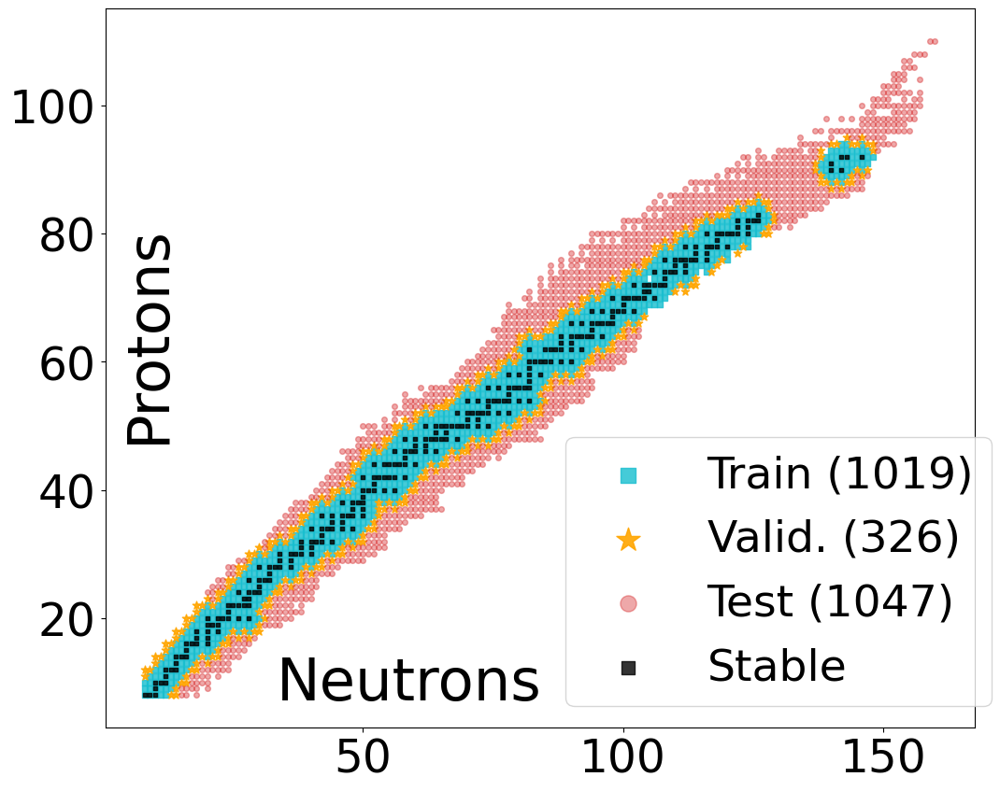

In [31]:
plt.rc("xtick", labelsize=35)
plt.rc("ytick", labelsize=35)

fig, ax = plt.subplots(figsize=(12,10), dpi=100)


color_trainig=colors[9]
color_validation='orange'
color_testing=colors[3]

marker_trainig='s'
marker_validation='*'
marker_testing='o'



size_trainig=30/2
size_validation=80/2
size_testing=34/2

alpha_trainig=0.8
alpha_validation=0.9
alpha_testing=0.4



ax.scatter(x = training_set.T[0], y = training_set.T[1], label = "Train ("+ str(len(training_set))+")", alpha = alpha_trainig,color=color_trainig,s=size_trainig,marker=marker_trainig)

ax.scatter(x = validation_set.T[0], y = validation_set.T[1], label = "Valid. (" + str(len(validation_set))+")", alpha = alpha_validation,color=color_validation,s=size_validation,marker=marker_validation)

ax.scatter(x = test_set.T[0], y = test_set.T[1], label = "Test (" + str(len(test_set))+")", alpha = alpha_testing,color=color_testing,s=size_testing,marker=marker_testing)


ax.scatter(x = stable_coordinates.T[0], y = stable_coordinates.T[1], label = "Stable", alpha = 0.8,color='black',s=11,marker="s")







# plt.xlabel("Neutrons",fontsize=45, labelpad=-20)


plt.xlabel('')

plt.annotate('Neutrons', xy=(0.35, 0.1), xycoords='axes fraction',
             ha='center', va='top', fontsize=45) 
plt.ylabel('')

plt.annotate('Protons', xy=(0.05,0.7), xycoords='axes fraction',
             ha='center', va='top', fontsize=45,rotation =90) 


# plt.ylabel("Protons",fontsize=45)
plt.legend(fontsize=34,markerscale=3 ,loc =(0.53,0.03))
plt.show()

In [32]:

models_output = selected_models_data_sets

models_output.rename(columns={'AME2020': 'truth'}, inplace=True)
models_output["A"] = models_output["N"] + models_output["Z"]


cols = list(models_output.columns)

cols[2], cols[-1] = cols[-1], cols[2]

models_output = models_output[cols]


models_output_train = {}
models_output_validation = {}
models_output_test = {}
key_list=models_selected[1:]



In [33]:
# #Coment this if we want to use BE and not BE/A

for model in key_list:
    models_output[model] = -models_output[model] / models_output['A']
models_output['truth'] = -models_output['truth'] / models_output['A']

In [34]:
models_output

,N,Z,A,SKMS,SKP,SLY4,SV,UNEDF0,UNEDF1,UNEDF2,FRDM12,HFB24,BCPM,D1M,truth
0,8,8,16,-8.053527,-8.056562,-8.114964,-7.960515,-7.919281,-7.606591,-7.621918,-8.001875,-7.852026,-7.937996,-8.001800,-7.976207
1,9,8,17,-7.909009,-7.895070,-7.909751,-7.779334,-7.792157,-7.463222,-7.454393,-7.791176,-7.628455,-7.803727,-7.815043,-7.750729
2,10,8,18,-8.041459,-8.026936,-8.040800,-7.886864,-7.891130,-7.562399,-7.569973,-7.880000,-7.671948,-7.841417,-7.833362,-7.767098
3,11,8,19,-7.869486,-7.814720,-7.800952,-7.675382,-7.707489,-7.381692,-7.383217,-7.628947,-7.470862,-7.668926,-7.617628,-7.566495
4,12,8,20,-7.923031,-7.842457,-7.824432,-7.687317,-7.706054,-7.381012,-7.406419,-7.649000,-7.596385,-7.652080,-7.595236,-7.568571
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2387,156,108,264,-7.241216,-7.266446,-7.258083,-7.271679,-7.293390,-7.296239,-7.296693,-7.301212,-7.298280,-7.282607,-7.267137,-7.298376
2388,157,108,265,-7.242584,-7.264018,-7.257031,-7.271036,-7.292623,-7.295112,-7.295392,-7.299358,-7.297612,-7.281121,-7.265005,-7.296247
2389,158,108,266,-7.245231,-7.267509,-7.258155,-7.272760,-7.294207,-7.296286,-7.296959,-7.302707,-7.299318,-7.283865,-7.269273,-7.298261
2390,159,110,269,-7.192733,-7.217637,-7.210703,-7.224513,-7.246841,-7.249168,-7.248964,-7.256283,-7.252260,-7.235673,-7.219948,-7.250155


In [35]:

models_output_train = models_output.iloc[train_coordinates]

models_output_validation = models_output.iloc[validation_coordinates]

models_output_test = models_output.iloc[test_coordinates]

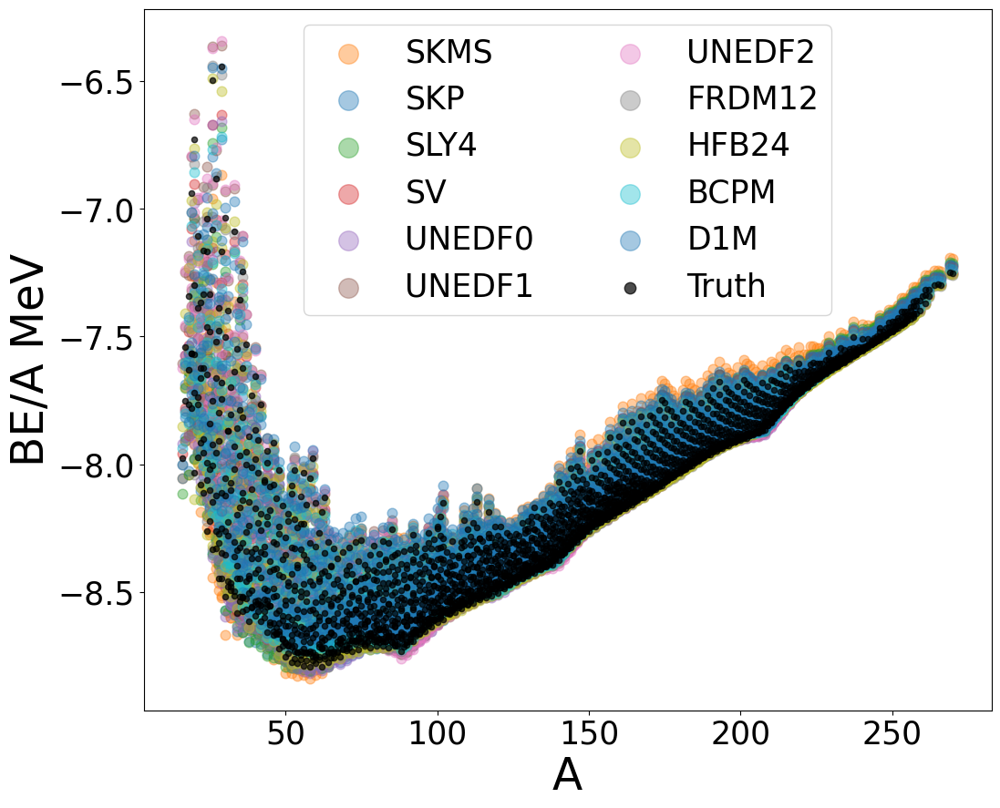

In [36]:
plt.rc("xtick", labelsize=25)
plt.rc("ytick", labelsize=25)

fig, ax = plt.subplots(figsize=(12,10), dpi=100)

i=0
for model in key_list:

    ax.scatter(x = models_output["A"], y = models_output[model], label = model,color=colors[i] ,alpha = 0.4,marker=markers[0],s=60)
    i=i+1   




ax.scatter(x = models_output["A"], y = models_output['truth'], label = "Truth", alpha = 0.7,color='k',s=20)


plt.xlabel("A",fontsize=35)
plt.ylabel("BE/A MeV",fontsize=35)
plt.legend(fontsize=25,markerscale=2,ncol=2  )

plt.show()

In [37]:
residuals = models_output['truth'].values[:,None] - models_output[key_list].values 

residuals_train = models_output_train['truth'].values[:,None] - models_output_train[key_list].values 

residuals_validation  = models_output_validation['truth'].values[:,None] - models_output_validation[key_list].values 

residuals_test  = models_output_test['truth'].values[:,None] - models_output_test[key_list].values 



model_predictions=models_output[key_list].values
model_predictions_train=models_output_train[key_list].values
model_predictions_validation=models_output_validation[key_list].values
model_predictions_test=models_output_test[key_list].values






model_summary = {}
model_summary["rmse_all"] = np.sqrt(np.mean(residuals ** 2, axis = 0))
model_summary["rmse_train"] = np.sqrt(np.mean(residuals_train ** 2, axis = 0))
model_summary["rmse_validation"] = np.sqrt(np.mean(residuals_validation ** 2, axis = 0))
model_summary["rmse_test"] = np.sqrt(np.mean(residuals_test ** 2, axis = 0))


model_summary_df = pd.DataFrame(model_summary, index =key_list)
print(model_summary_df)
print(model_summary_df.style.format(precision = 2).to_latex())
#print(model_summary_df.to_latex(float_format="%.2f"))

        rmse_all  rmse_train  rmse_validation  rmse_test
SKMS    0.067566    0.048767         0.082855   0.077314
SKP     0.041237    0.034312         0.055893   0.042029
SLY4    0.041306    0.037689         0.053175   0.040435
SV      0.028380    0.030589         0.028035   0.026166
UNEDF0  0.026321    0.021511         0.040166   0.025103
UNEDF1  0.046307    0.058515         0.043406   0.031304
UNEDF2  0.046313    0.059658         0.040513   0.030421
FRDM12  0.012939    0.014611         0.012954   0.011067
HFB24   0.012273    0.014748         0.012523   0.009144
BCPM    0.029315    0.033884         0.026171   0.025153
D1M     0.053363    0.060931         0.053320   0.044801
\begin{tabular}{lrrrr}
 & rmse_all & rmse_train & rmse_validation & rmse_test \\
SKMS & 0.07 & 0.05 & 0.08 & 0.08 \\
SKP & 0.04 & 0.03 & 0.06 & 0.04 \\
SLY4 & 0.04 & 0.04 & 0.05 & 0.04 \\
SV & 0.03 & 0.03 & 0.03 & 0.03 \\
UNEDF0 & 0.03 & 0.02 & 0.04 & 0.03 \\
UNEDF1 & 0.05 & 0.06 & 0.04 & 0.03 \\
UNEDF2 & 0.05 & 0.

In [38]:
model_summary_df

,rmse_all,rmse_train,rmse_validation,rmse_test
SKMS,0.067566,0.048767,0.082855,0.077314
SKP,0.041237,0.034312,0.055893,0.042029
SLY4,0.041306,0.037689,0.053175,0.040435
SV,0.028380,0.030589,0.028035,0.026166
UNEDF0,0.026321,0.021511,0.040166,0.025103
UNEDF1,0.046307,0.058515,0.043406,0.031304
UNEDF2,0.046313,0.059658,0.040513,0.030421
FRDM12,0.012939,0.014611,0.012954,0.011067
HFB24,0.012273,0.014748,0.012523,0.009144
BCPM,0.029315,0.033884,0.026171,0.025153


In [39]:
Selected_element=50
Selected_element_name="Sn"

Z_range=(Selected_element,Selected_element)
N_range=(0,300)


filtered_models_output = models_output[(models_output['Z'] >= Z_range[0]) & (models_output['Z'] <= Z_range[1]) & 
                     (models_output['N'] >= N_range[0]) & (models_output['N'] <= N_range[1])]

filtered_models_output_train = models_output_train[(models_output_train['Z'] >= Z_range[0]) & (models_output_train['Z'] <= Z_range[1]) & 
                     (models_output_train['N'] >= N_range[0]) & (models_output_train['N'] <= N_range[1])]

filtered_models_output_test = models_output_test[(models_output_test['Z'] >= Z_range[0]) & (models_output_test['Z'] <= Z_range[1]) & 
                     (models_output_test['N'] >= N_range[0]) & (models_output_test['N'] <= N_range[1])]

filtered_models_output_validation = models_output_validation[(models_output_validation['Z'] >= Z_range[0]) & (models_output_validation['Z'] <= Z_range[1]) & 
                     (models_output_validation['N'] >= N_range[0]) & (models_output_validation['N'] <= N_range[1])]


stable_selected_isotope=[]

for i in range(len(stable_coordinates)):
    if stable_coordinates[i][1]==Selected_element:
        stable_selected_isotope.append(stable_coordinates[i])

stable_selected_isotope=np.array(stable_selected_isotope)

# df[df['Column1'].isin(values_array)]

filtered_models_output_stable = models_output_train[(models_output_train['Z'] >= Z_range[0]) & (models_output_train['Z'] <= Z_range[1]) & 
                     (models_output_train['N'].isin(stable_selected_isotope.T[0]))]

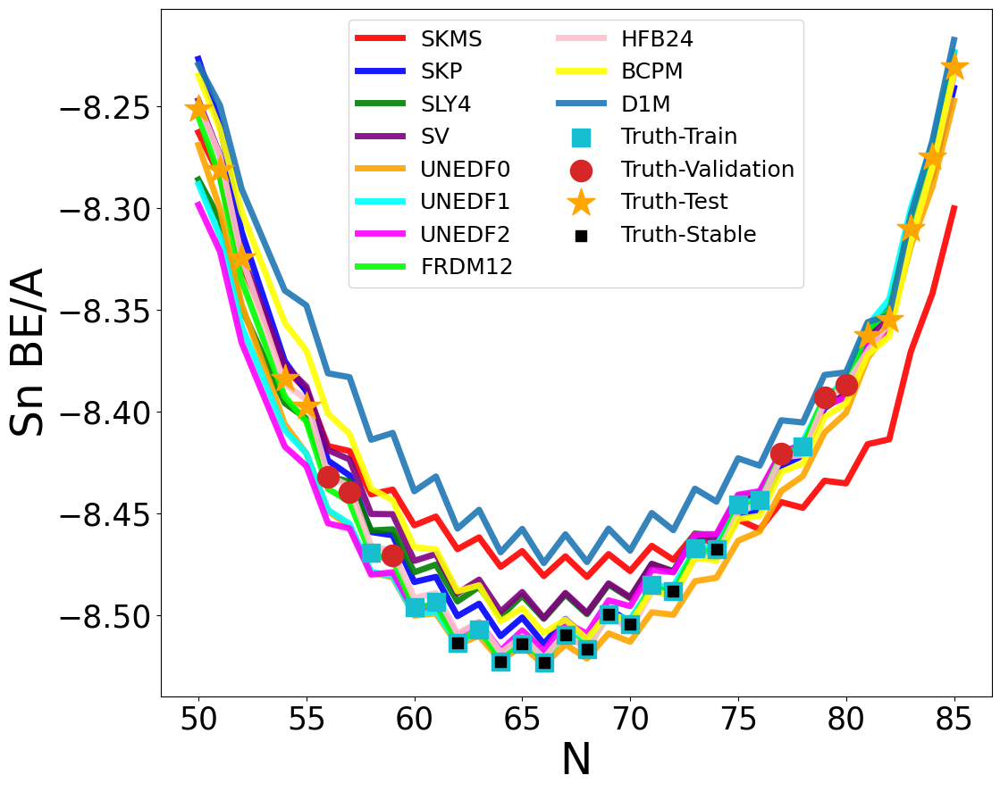

In [40]:
plt.rc("xtick", labelsize=25)
plt.rc("ytick", labelsize=25)

fig, ax = plt.subplots(figsize=(12,10), dpi=100)



i=0
for model in key_list:
   
    ax.plot(filtered_models_output["N"], filtered_models_output[model], label = model, color=colors_models[i], alpha = 0.9,linewidth=5,zorder=1)
    i=i+1
           



ax.scatter(x = filtered_models_output_train["N"], y = filtered_models_output_train['truth'], label = "Truth-Train",  alpha = 1,color=colors[9],s=200,marker="s",zorder=2)

ax.scatter(x = filtered_models_output_validation["N"], y = filtered_models_output_validation['truth'], label = "Truth-Validation", alpha = 1,color=colors[3],s=300,marker="o",zorder=2)

ax.scatter(x = filtered_models_output_test["N"], y = filtered_models_output_test['truth'], label = "Truth-Test", alpha = 1,color='orange',s=550,marker="*",zorder=2)

ax.scatter(x = filtered_models_output_stable["N"], y = filtered_models_output_stable['truth'], label = "Truth-Stable", alpha = 1,color='k',s=80,marker="s",zorder=2)



plt.xlabel("N",fontsize=35)
plt.ylabel(Selected_element_name+" BE/A",fontsize=35)
plt.legend(fontsize=18,markerscale=1 , ncols=2)

plt.show()

## PCA - Analysis

In [41]:
predictions_mean= np.mean(model_predictions, axis=1)
predictions_train_mean= np.mean(model_predictions_train, axis=1)
predictions_validation_mean= np.mean(model_predictions_validation, axis=1)
predictions_test_mean= np.mean(model_predictions_test, axis=1)

In [42]:
if centering_data:
    model_predictions_train_processed=np.array([model_predictions_train.T[j]-predictions_train_mean for j in range(len(model_predictions_train.T))]).T
else:
    model_predictions_train_processed=np.copy(model_predictions_train)



In [43]:
U, S, Vt = np.linalg.svd(model_predictions_train_processed)

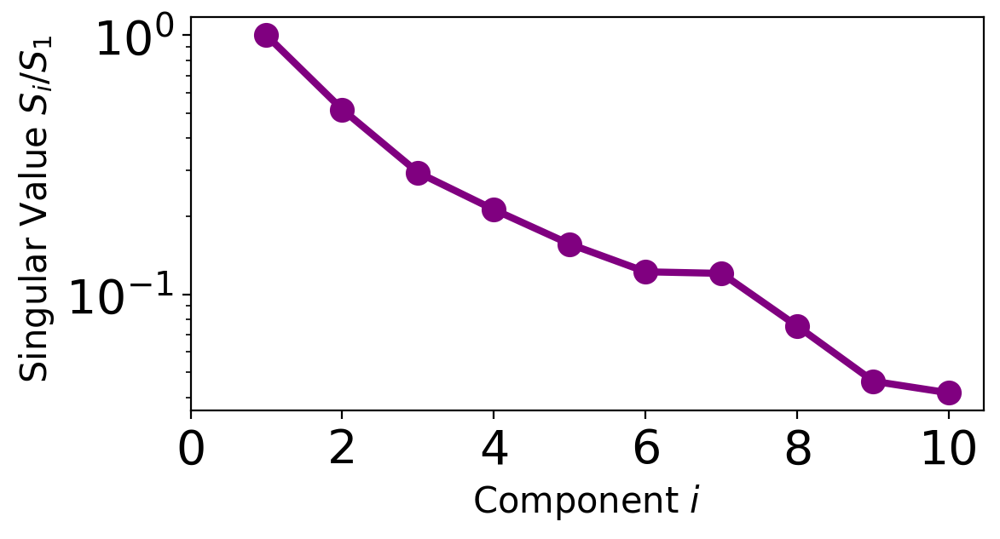

In [44]:
plt.rc("xtick", labelsize=20)
plt.rc("ytick", labelsize=20)


fig, ax = plt.subplots(figsize=(6,3),dpi=200)
fig.patch.set_facecolor('white')

#We plot only up to n-1 singular values if we centered the data because the nth value is numerical noise ~10**(-15)
if centering_data:
    ax.scatter(np.arange(1,S.size), S[0:-1]/S[0],color='purple',s=90)
    ax.plot(np.arange(1,S.size), S[0:-1]/S[0],color='purple',linewidth=3)
else:
    ax.scatter(np.arange(1,S.size+1), S/S[0],color='purple',s=90)
    ax.plot(np.arange(1,S.size+1), S/S[0],color='purple',linewidth=3)    

ax.set_yscale('log')
ax.set_xlabel(r'Component $i$',fontsize=15)
ax.set_ylabel(r' Singular Value $S_i/S_1$',fontsize=15);
# plt.ylim(2*10**(-3),1.5)
ax.set_xticks([0,2,4,6,8,10])
# plt.title("Singular values decay",fontsize=30)
plt.show()

In [45]:
components_kept=3
S_hat=np.array([S[i] for i in range(components_kept)])


#No scalling at all:
# U_hat=np.array([U.T[i]*S_hat[i] for i in range(components_kept)])
U_hat=np.array([U.T[i] for i in range(components_kept)])
Vt_hat=np.array([Vt[i]/S[i] for i in range(components_kept)])
Vt_hat_normalized=np.array([Vt[i] for i in range(components_kept)])

#Scaling manually:
# U_hat=np.array([U.T[i]*np.linalg.norm(predictions_train_mean) for i in range(components_kept)])
# #This represents the coefficients that we use to write the normalized PC everywhere as linear combinations of the original models. It is scaled by 
# # the values of S_hat such that the norm of the PC keeps ~ constant even as we increase the number of models
# Vt_hat=np.array([Vt[i]/S_hat[i]*np.linalg.norm(predictions_train_mean) for i in range(components_kept)])   
# #These are the normalized coefficients (norm[Vt_hat_normalized[i]] is 1). We use this to plot PC projections to distinguish between clusters of models
# Vt_hat_normalized=np.array([Vt[i] for i in range(components_kept)])







if centering_data:
    num_components=components_kept+1
else:
    num_components=components_kept


In [46]:
#Creating principal components that are for training. These should be equivalent to \hat U, and if they are not there is something wrong



models_PC_train = {}

if centering_data:
    models_PC_train[str("PC_0")] = predictions_train_mean
    
for i in range(components_kept):
    models_PC_train[str("PC_")+str(i+1)] = np.dot(Vt_hat[i],model_predictions_train.T)

models_PC_train["N"] = models_output_train["N"]
models_PC_train["Z"] = models_output_train["Z"]
models_PC_train["A"] = models_PC_train["N"] + models_PC_train["Z"]

models_PC_training = pd.DataFrame(models_PC_train)



In [47]:
#Creating principal components that are for validation



models_PC_validation = {}

if centering_data:
    models_PC_validation[str("PC_0")] = predictions_validation_mean
    
for i in range(components_kept):
    models_PC_validation[str("PC_")+str(i+1)] = np.dot(Vt_hat[i],model_predictions_validation.T)

models_PC_validation["N"] = models_output_validation["N"]
models_PC_validation["Z"] = models_output_validation["Z"]
models_PC_validation["A"] = models_PC_validation["N"] + models_PC_validation["Z"]

models_PC_validation = pd.DataFrame(models_PC_validation)



In [48]:
#Creating principal components that are for testing



models_PC_testing = {}

if centering_data:
    models_PC_testing[str("PC_0")] = predictions_test_mean
for i in range(components_kept):
    # models_PC_testing[str("PC_")+str(i+1)] = np.dot(Vt_hat[i],model_predictions_test.T)*S_hat[i]
    models_PC_testing[str("PC_")+str(i+1)] = np.dot(Vt_hat[i],model_predictions_test.T)

models_PC_testing["N"] = models_output_test["N"]
models_PC_testing["Z"] = models_output_test["Z"]
models_PC_testing["A"] = models_PC_testing["N"] + models_PC_testing["Z"]

models_PC_testing = pd.DataFrame(models_PC_testing)






In [49]:
#Creating principal components that are valid everywhere (testing + training + validation)
models_PC = {}

if centering_data:
    models_PC[str("PC_0")] = predictions_mean

for i in range(components_kept):
    models_PC[str("PC_")+str(i+1)] = np.dot(Vt_hat[i],model_predictions.T)

models_PC = pd.DataFrame(models_PC)
models_PC["N"] = filtered_NZ.T[0]
models_PC["Z"] = filtered_NZ.T[1]
models_PC["A"] = models_PC["N"] + models_PC["Z"]

In [50]:
filtered_models_PC = models_PC[(models_PC['Z'] >= Z_range[0]) & (models_PC['Z'] <= Z_range[1]) & 
                     (models_PC['N'] >= N_range[0]) & (models_PC['N'] <= N_range[1])]

In [51]:
key_list_PCs=list(filtered_models_PC.keys())

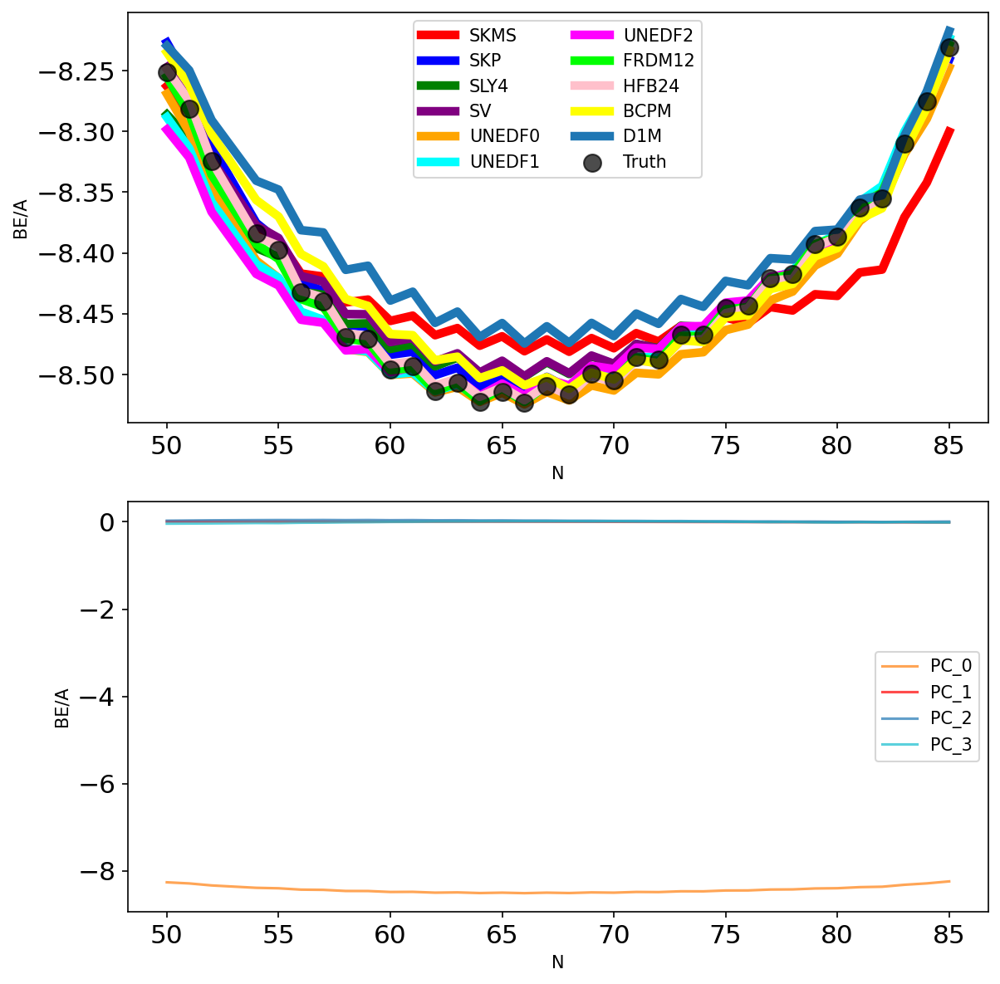

In [52]:
plt.rc("xtick", labelsize=15)
plt.rc("ytick", labelsize=15)

# fig, ax = plt.subplots(figsize=(12,10), dpi=100)
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(8, 8),dpi=150)



i=0
for model in key_list:
   
    ax1.plot(filtered_models_output["N"], filtered_models_output[model], label = model, color=colors_models[i],linewidth=5,zorder=1)
    i=i+1



ax1.scatter(x = filtered_models_output["N"], y = filtered_models_output['truth'], label = "Truth", alpha = 0.7,color='k',s=100)

ax1.set_xlabel("N")
ax1.set_ylabel("BE/A")
ax1.legend( ncols=2)







for i in range(num_components):
    ax2.plot(filtered_models_PC["N"], filtered_models_PC[key_list_PCs[i]], label =key_list_PCs[i], alpha = 0.7,color=colors[-i])

ax2.set_xlabel("N")
ax2.set_ylabel("BE/A")
ax2.legend()





plt.tight_layout()

plt.show()

In [53]:
x_values=models_PC["N"].tolist()
y_values=models_PC["Z"].tolist()
pc_data=[]

if centering_data:
    pc_data.append([x_values,y_values,models_PC["PC_0"].tolist()])

for i in range(components_kept):
    pc_data.append([x_values,y_values,models_PC[str("PC_")+str(i+1)].tolist()])

    
pc_data=np.array(pc_data)    

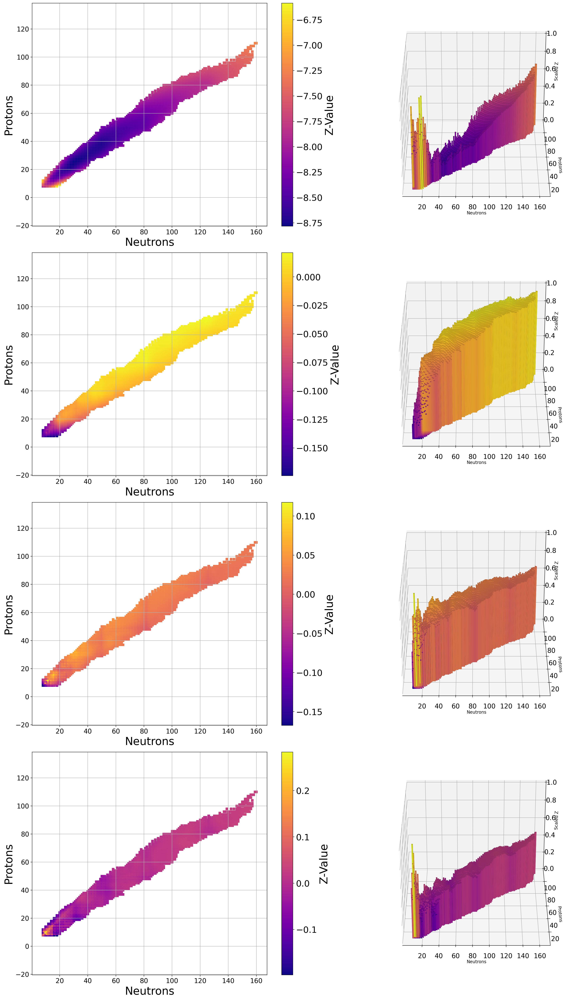

In [54]:
PlotMultiple(pc_data,[30,-90])

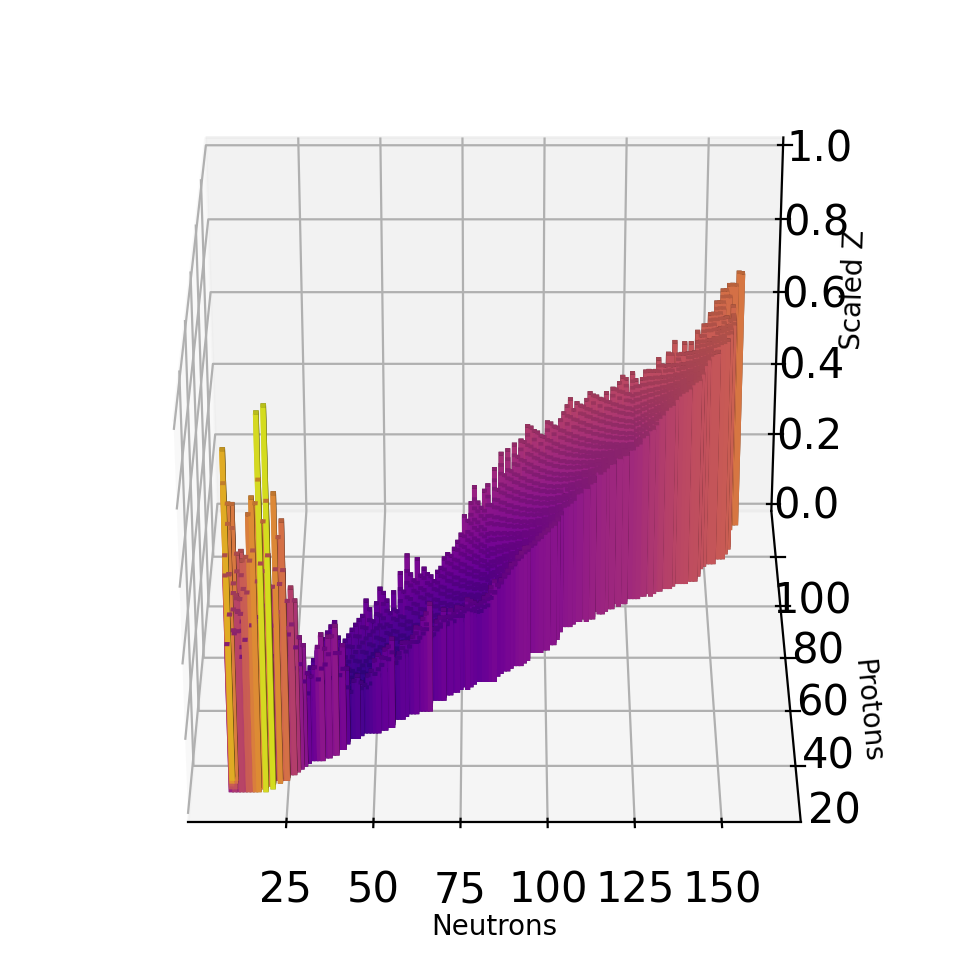

In [55]:
Plotter3D_single(pc_data[0],elev=30,azim=-90)

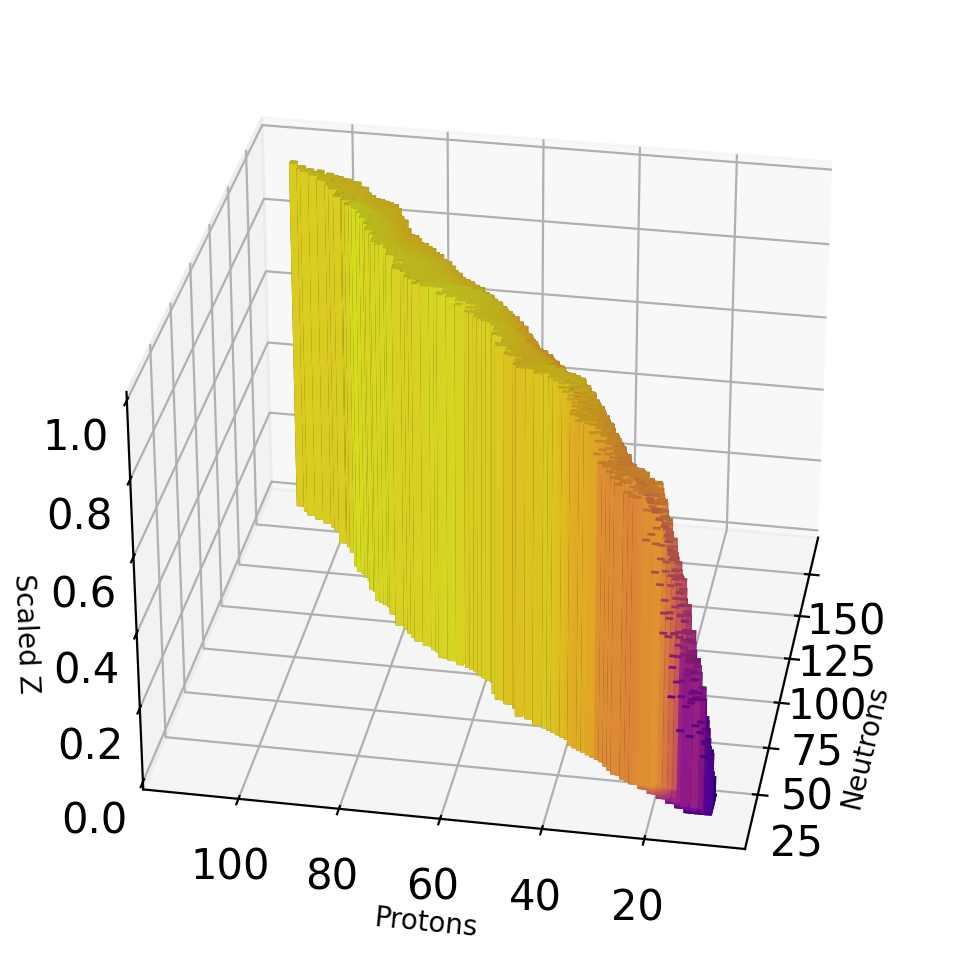

In [56]:
Plotter3D_single(pc_data[1],elev=30,azim=-170)

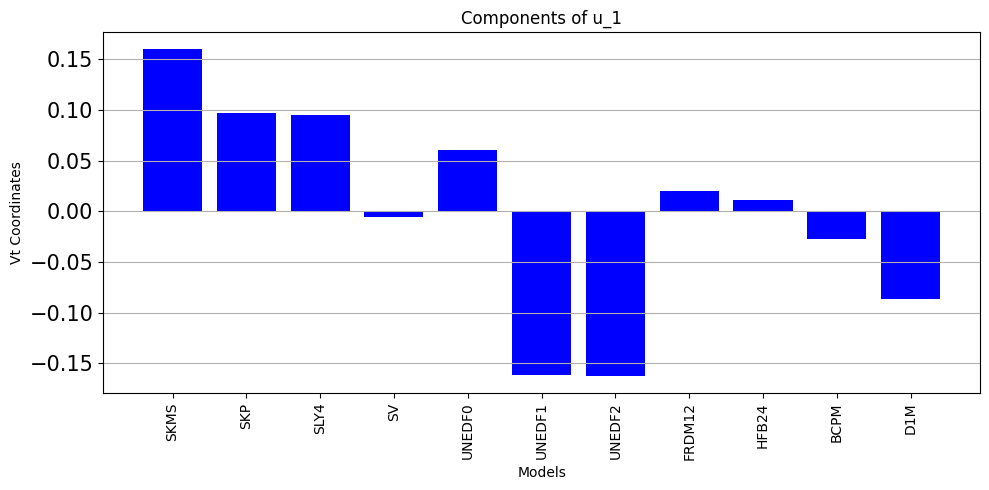

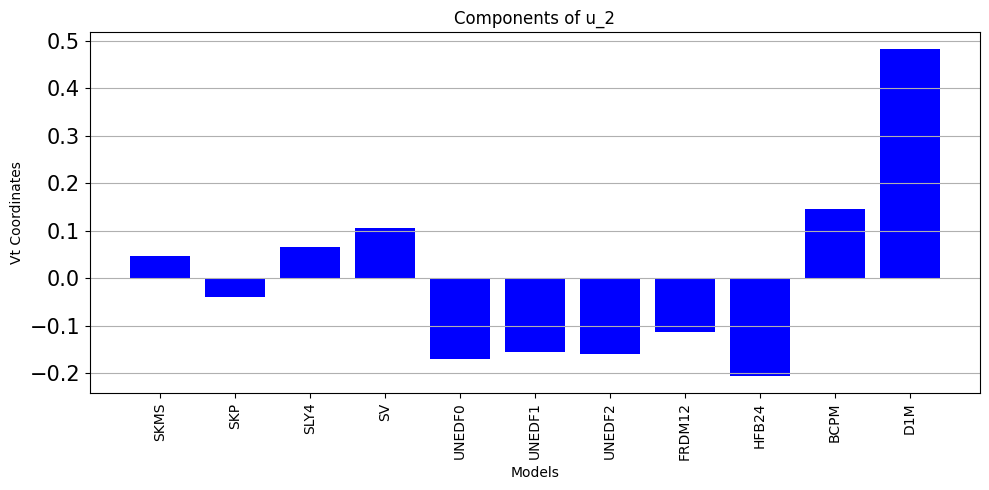

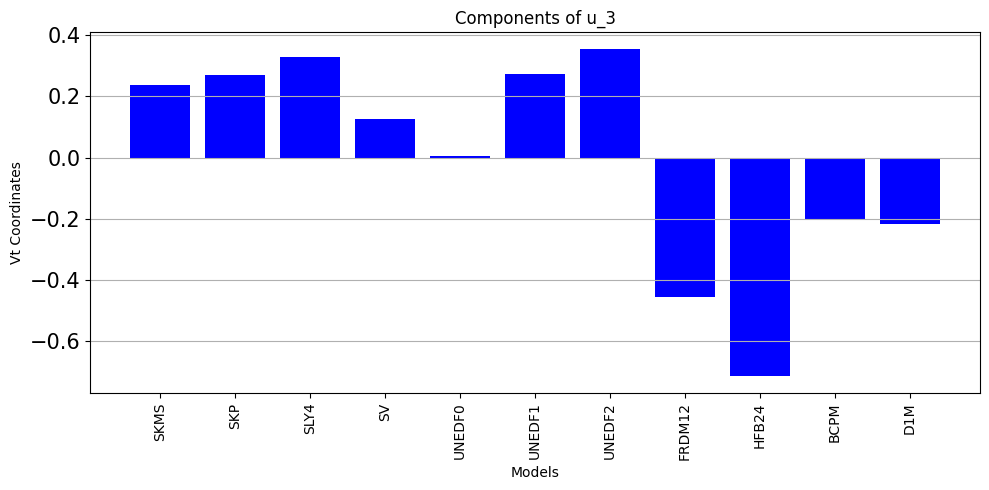

In [57]:


for i in range(len(Vt_hat)):

    plot_bars(Vt_hat[i], key_list, title=f"Components of u_{i+1}", color='blue')

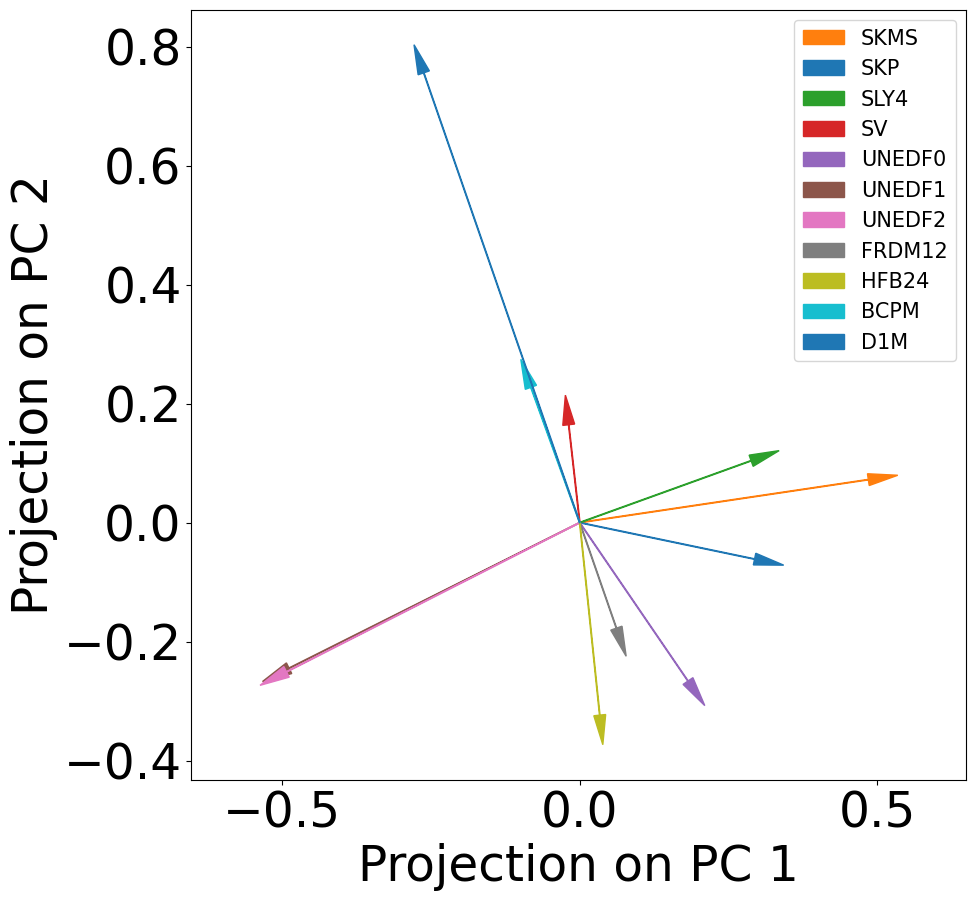

In [58]:

plt.rc("xtick", labelsize=35)
plt.rc("ytick", labelsize=35)

fig, ax = plt.subplots(figsize=(10,10), dpi=100)


visited_model=0
for model in key_list:
    ax.arrow(0, 0, Vt_hat_normalized.T[visited_model][0],Vt_hat_normalized.T[visited_model][1], 
            head_width=0.02, head_length=0.05, fc=colors[visited_model], ec=colors[visited_model],label=model)

    visited_model=visited_model+1


plt.xlabel('Projection on PC 1',fontsize=35)
plt.ylabel('Projection on PC 2',fontsize=35)

plt.legend(fontsize=15)
# ax.set_xticks([-0.2,0,0.2,0.4,0.6])
plt.axis('equal')
# plt.xlim(-0.25, 0.6)
# plt.ylim(-0.43, 0.5)

plt.show()


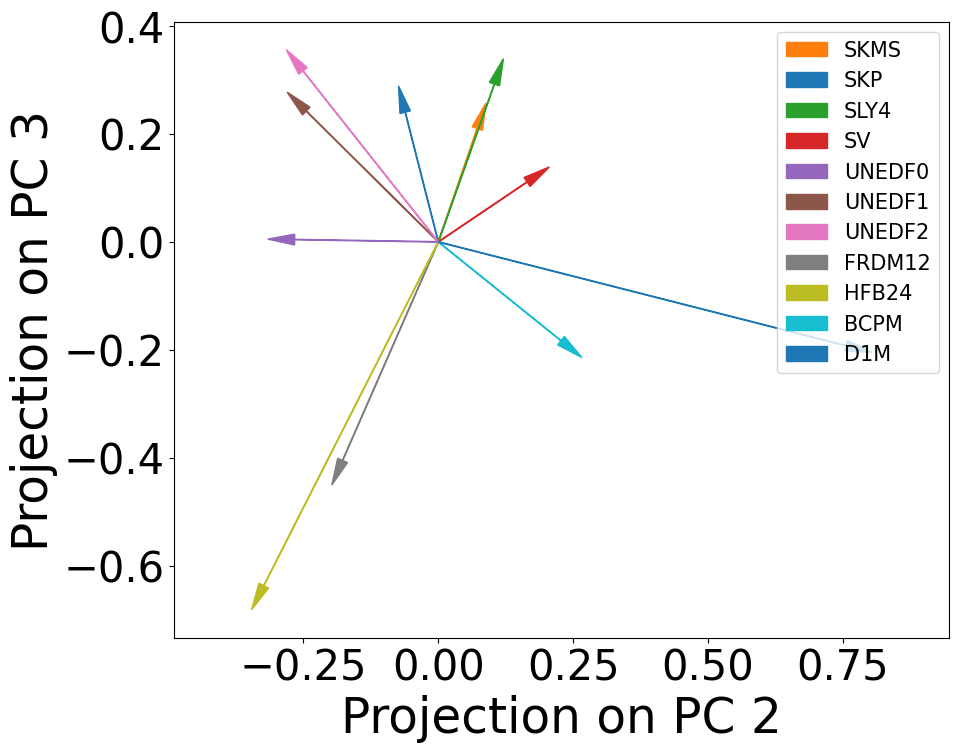

In [59]:

if components_kept>2:

    plt.rc("xtick", labelsize=30)
    plt.rc("ytick", labelsize=30)

    fig, ax = plt.subplots(figsize=(10,8), dpi=100)




    visited_model=0
    for model in key_list:
        ax.arrow(0, 0, Vt_hat_normalized.T[visited_model][1],Vt_hat_normalized.T[visited_model][2], 
                head_width=0.02, head_length=0.05, fc=colors[visited_model], ec=colors[visited_model],label=model)

        visited_model=visited_model+1




    # Determine plot limits based on the maximum absolute values of the vectors
    # max_val = max(max(abs(coordinate) for vector in list1 + list2 for coordinate in vector))
    # plt.xlim(-max_val-1, max_val+1)
    # plt.ylim(-max_val-1, max_val+1)

    plt.xlabel('Projection on PC 2',fontsize=35)
    plt.ylabel('Projection on PC 3',fontsize=35)

    plt.legend(fontsize=15)

    plt.axis('equal')

    plt.show()


In [60]:

if components_kept>3:

    plt.rc("xtick", labelsize=30)
    plt.rc("ytick", labelsize=30)

    fig, ax = plt.subplots(figsize=(10,8), dpi=100)




    visited_model=0
    for model in key_list:
        ax.arrow(0, 0, Vt_hat_normalized.T[visited_model][2],Vt_hat_normalized.T[visited_model][3], 
                head_width=0.02, head_length=0.05, fc=colors[visited_model], ec=colors[visited_model],label=model)

        visited_model=visited_model+1




    # Determine plot limits based on the maximum absolute values of the vectors
    # max_val = max(max(abs(coordinate) for vector in list1 + list2 for coordinate in vector))
    # plt.xlim(-max_val-1, max_val+1)
    # plt.ylim(-max_val-1, max_val+1)

    plt.xlabel('Projection on PC 3',fontsize=35)
    plt.ylabel('Projection on PC 4',fontsize=35)

    plt.legend(fontsize=15)

    plt.axis('equal')

    plt.show()


In [61]:
X=np.copy(U_hat)
if centering_data:
    y=np.copy(models_output_train["truth"].tolist())-predictions_train_mean
else:
    y=np.copy(models_output_train["truth"].tolist())

In [62]:
#Making the list of principal components across the train part. These should be identical to the X on top made by \hat U
X_train=[]
for i in range(num_components):
    X_train.append(models_PC_train[key_list_PCs[i]].tolist() )
# if centering_data==True:
#     for i in range(num_components):
#         X_train.append(models_PC_train[key_list_PCs[i]].tolist() )

# else:
#     for i in range(num_components):
#         X_train.append(models_PC_train[key_list_PCs[i]].tolist())

X_train=np.array(X_train)

In [63]:
#Making the list of principal components across the validation part
X_validation=[]
for i in range(num_components):
    X_validation.append(models_PC_validation[key_list_PCs[i]].tolist())
# if centering_data==True:
#     for i in range(num_components):
#         X_validation.append(models_PC_validation[key_list_PCs[i]].tolist())
# else:
#     for i in range(num_components):
#         X_validation.append(models_PC_validation[key_list_PCs[i]].tolist())
X_validation=np.array(X_validation)

In [64]:
#Making the list of principal components across the testing part
X_test=[]
for i in range(num_components):
    X_test.append(models_PC_testing[key_list_PCs[i]].tolist())

# if centering_data==True:
#     for i in range(num_components):
#         X_test.append(models_PC_testing[key_list_PCs[i]].tolist())
# else:
#     for i in range(num_components):
#         X_test.append(models_PC_testing[key_list_PCs[i]].tolist())
X_test=np.array(X_test)

In [65]:
#Making the list of principal components across the entire chart (training+validation+testing)
X_full=[]
for i in range(num_components):
    X_full.append(models_PC[key_list_PCs[i]].tolist())
# if centering_data==True:
#     for i in range(num_components):
#         X_full.append(models_PC[key_list_PCs[i]].tolist())
# else:
#     for i in range(num_components):
#         X_full.append(models_PC[key_list_PCs[i]].tolist())
X_full=np.array(X_full)

## For unconstrained estimation the problem is trivial and can be solved by linear equations:

In [66]:
# 1) Find the least square solution for the training part
X_T_X=X.dot(X.T)
X_T_X_inv = np.linalg.inv(X_T_X)

beta = X_T_X_inv.dot(X).dot(y)

# if centering_data==True:
#     supermodel=X.T.dot(beta) + predictions_train_mean
# else:
#     supermodel=X.T.dot(beta)

#1.5) Construct the super model across the entire range and the test range
if centering_data:
    beta_full= np.insert(beta, 0, 1)  #Augmenting the beta list to add a "1" at the begining so it can use the PC0 (the mean)
else:
    beta_full=np.copy(beta)



supermodel=X_train.T.dot(beta_full)

supermodel_train=X_train.T.dot(beta_full)
# supermodel_train=np.copy(supermodel)

supermodel_validation=X_validation.T.dot(beta_full)
supermodel_test=X_test.T.dot(beta_full)
supermodel_full=X_full.T.dot(beta_full)


# 2) Construct the covariance matrix
if centering_data==True:
    residuals = y - supermodel + predictions_train_mean
else:
    residuals = y - supermodel
sigma_squared = np.sum(residuals**2) / len(residuals) 
cov_matrix = sigma_squared * X_T_X_inv

# 3) Make a corner plot
samples = np.random.multivariate_normal(beta, cov_matrix, size=500000)


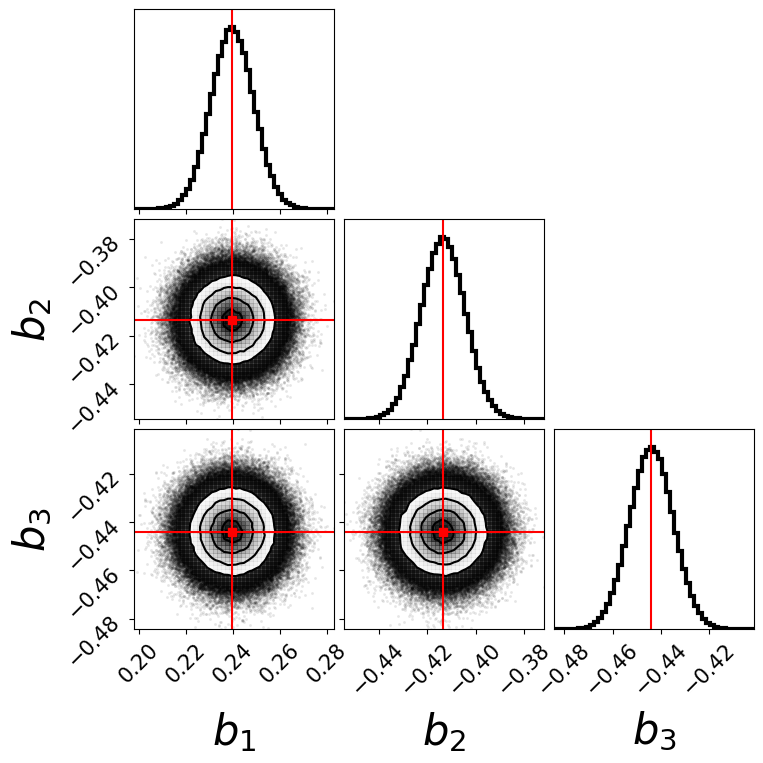

In [67]:
plt.rc("xtick", labelsize=15)
plt.rc("ytick", labelsize=15)

figure = corner.corner(samples,bins=50, dpi=300, hist_kwargs={"linewidth": 3},
                       labels=[f'$b_{i}$' for i in range(1, len(beta) + 1)], truths=beta,truth_color="r",
                       label_kwargs={"fontsize": 30},labelpad=0.1)


plt.show()

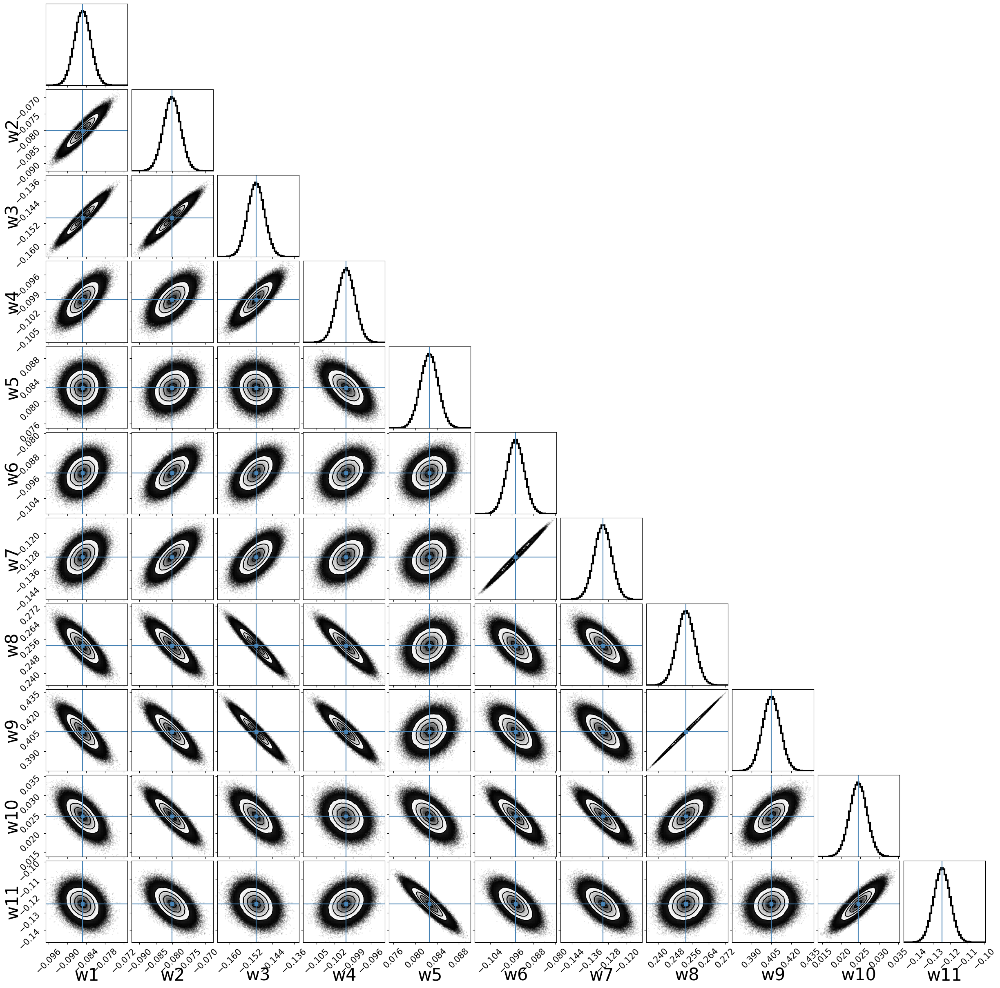

In [68]:
# # 4) Make a corner plot in the space of the naive models
samples_naive_space = np.array([np.dot(betaval,Vt_hat)  for  betaval in samples])


figure = corner.corner(samples_naive_space, bins=50, dpi=300, hist_kwargs={"linewidth": 3},labels=[f'w{i}' for i in range(1, len(Vt_hat.T) + 1)], truths=np.dot(beta,Vt_hat),label_kwargs={"fontsize": 30})
# figure = corner.corner(samples_naive_space)

plt.show()


In [69]:
[np.sum(samples_naive_space[i]) for i in range(len(samples_naive_space))]

[-3.858025010572419e-15,
 -3.747002708109903e-15,
 -3.816391647148976e-15,
 -3.7192471324942744e-15,
 -3.858025010572419e-15,
 -3.635980405647388e-15,
 -3.774758283725532e-15,
 -3.774758283725532e-15,
 -3.83026943495679e-15,
 -3.6914915568786455e-15,
 -3.927413949611491e-15,
 -3.83026943495679e-15,
 -3.95516952522712e-15,
 -3.788636071533347e-15,
 -3.6914915568786455e-15,
 -3.7192471324942744e-15,
 -3.608224830031759e-15,
 -3.6914915568786455e-15,
 -3.649858193455202e-15,
 -3.747002708109903e-15,
 -3.7192471324942744e-15,
 -3.885780586188048e-15,
 -3.774758283725532e-15,
 -3.733124920302089e-15,
 -3.7192471324942744e-15,
 -3.885780586188048e-15,
 -3.83026943495679e-15,
 -3.83026943495679e-15,
 -3.733124920302089e-15,
 -3.6637359812630166e-15,
 -3.83026943495679e-15,
 -3.774758283725532e-15,
 -3.6637359812630166e-15,
 -3.941291737419306e-15,
 -3.760880495917718e-15,
 -3.802513859341161e-15,
 -3.7192471324942744e-15,
 -3.83026943495679e-15,
 -3.733124920302089e-15,
 -3.941291737419306e-1

## For constrained estimation the problem is more complex and we need to define our likelihood and prior functions (we are putting the constraint in the prior)

In [70]:
# if centering_data:  #Calculating a bias term to add to the coefficient transformation to account for the \phi0 term
#     bias0=np.full(len(model_predictions_train.T),1/len(model_predictions_train.T))
# else:
#     bias0=np.full(len(model_predictions_train.T),0)

In [71]:
# def b1_finder(beta_2m,Vt_hat):
# #     beta_2m is a list of the beta values that are active
#     if len(beta_2m)<1:
#         print("AAAAAAAAAAA!")
#     return (1-np.sum(bias0)-np.sum(np.dot(Vt_hat[1:].T,beta_2m)))/np.sum(Vt_hat[0].T)

In [72]:
# # Define the likelihood function for given errors sigma
# def log_likelihood_PC(beta_2m,data):
#     #Assumed format for data=[yvals], it is also assummed to be centered or not centered directly (either y-\phi0 or just y)
    
#     beta = np.insert(beta_2m, 0, b1_finder(beta_2m,Vt_hat))
    
#     residuals=y-X_train.T.dot(beta)

#     return -np.sum(residuals**2)




In [73]:
# # Define the likelihood function for given errors sigma
# def log_likelihood_PC_unormalized(beta,data):
#     #Assumed format for data=[yvals], it is also assummed to be centered or not centered directly (either y-\phi0 or just y)
    
# #     beta = np.insert(beta_2m, 0, b1_finder(beta_2m,Vt_hat))
    
#     residuals=y-X_train.T.dot(beta)

#     return -np.sum(residuals**2)




In [74]:
# # Define the prior function
# def log_prior_PC(beta_2m,Vt_hat):
#     beta = np.insert(beta_2m, 0, b1_finder(beta_2m,Vt_hat))
    
#     omegas=np.dot(beta,Vt_hat) + bias0
    
    
#     if  np.any(omegas < 0):
#         return -np.infty
#     else:
#         return 0
    

In [75]:
# # Define the prior function
# def log_prior_PC_unormalized(beta,Vt_hat):
# #     beta = np.insert(beta_2m, 0, b1_finder(beta_2m,Vt_hat))
    
#     omegas=np.dot(beta,Vt_hat) + bias0
    
#     return 0
    
#     if  np.any(omegas < 0):
#         return -np.infty
#     else:
#         return 0
    

In [76]:
# # Define the Metropolis algorithm
# def metropolis(data,sigma, log_prior,log_likelihood,\
#                num_iterations, step_size,initial_parameters,Vt_hat,normalized=True):
# #     step_size should be a list the size of the parameters of the model


#     #thermalizing
#     burn_samples=20000
#     # Set the initial state of the chain
#     params_current=initial_parameters
#     params_list=[]
#     posterior_list=[]
    
#     acceptance_times=0
    
#     cov_step_size=np.diag(step_size)**2
    

    
#     log_posterior_current=(log_likelihood(params_current,data))/sigma**2 + (log_prior(params_current,Vt_hat))

#     # Run the Metropolis-Hastings algorithm for burning
#     for i in range(burn_samples):
#         # Propose a new state for the chain
#         params_proposed=np.random.multivariate_normal(params_current,cov_step_size)

#         log_posterior_proposed=(log_likelihood(params_proposed,data))/sigma**2 + (log_prior(params_proposed,Vt_hat))
        
#         # Calculate the acceptance probability
#         acceptance_prob = min(1, np.exp((+log_posterior_proposed - log_posterior_current)))

#         # Accept or reject the proposal
#         if np.random.uniform() < acceptance_prob:
#             params_current = params_proposed
#             log_posterior_current=log_posterior_proposed


#     for i in range(num_iterations):
#         params_proposed=np.random.multivariate_normal(params_current,cov_step_size)
   
#         log_posterior_proposed=(log_likelihood(params_proposed,data))/sigma**2+ (log_prior(params_proposed,Vt_hat))
# #         print(log_posterior_proposed)
#         # Calculate the acceptance probability
#         acceptance_prob = min(1, np.exp((+log_posterior_proposed - log_posterior_current)))

#         # Accept or reject the proposal
#         if np.random.uniform() < acceptance_prob:
#             params_current = params_proposed
#             log_posterior_current=log_posterior_proposed
#             acceptance_times=acceptance_times+1

#         # Store the current state
#         if normalized:
#             params_list.append(np.insert(params_current, 0, b1_finder(params_current,Vt_hat)))
#         else:
#             params_list.append(params_current)
#         posterior_list.append(log_posterior_current*sigma**2)
        
    
#     #Rule of thumb acceptance is around 30%. 
#     #You could plot the accuracy of the estimations as a function of this rate, that would be interesting to see. 
#     print(acceptance_times/num_iterations*100,"%")
    
#     return(np.array(params_list),np.array(posterior_list),\
#            acceptance_times/num_iterations*100)

In [77]:
# %%time
# #For the case of 3, 5, 10 models keeping 3 PC
# met_res=metropolis(y,0.05, log_prior_PC,log_likelihood_PC,\
#                100000, np.array([0.002,0.002]),np.array([0.0,0.0]),Vt_hat,normalized=True)

In [78]:
# emp_sigma=np.sqrt(-np.mean(met_res[1])/len(y))

In [79]:
# %%time
# met_res=metropolis(y,emp_sigma, log_prior_PC,log_likelihood_PC,\
#                300000, np.array([0.003,0.003]),np.array([0.0,0.0]),Vt_hat,normalized=True)

In [80]:
# np.sqrt(-np.mean(met_res[1])/len(y))/emp_sigma

In [81]:
# emp_sigma=np.sqrt(-np.mean(met_res[1])/len(y))

In [82]:
# plt.rc("xtick", labelsize=15)
# plt.rc("ytick", labelsize=15)

# figure = corner.corner(met_res[0],bins=40, dpi=300, hist_kwargs={"linewidth": 3},
#                        labels=[f'$b_{i}$' for i in range(1, len(beta) + 1)],
# #                        truths=beta,truth_color="r",
#                        label_kwargs={"fontsize": 30},labelpad=0.1)


# plt.show()

In [83]:
# # # 4) Make a corner plot in the space of the naive models
# samples_naive_space = np.array([np.dot(betaval,Vt_hat)  for  betaval in met_res[0]])


# figure = corner.corner(samples_naive_space, bins=40, dpi=300, hist_kwargs={"linewidth": 3},labels=[f'w{i}' for i in range(1, len(Vt_hat.T) + 1)], truths=np.dot(beta,Vt_hat),label_kwargs={"fontsize": 30})
# # figure = corner.corner(samples_naive_space)

# plt.show()

In [84]:
# [np.sum(samples_naive_space[i]) for i in range(len(samples_naive_space))]

In [85]:
# # # 4) Make a corner plot in the space of the naive models
# samples_naive_space = np.array([np.dot(betaval,Vt_hat)  for  betaval in samples])


# figure = corner.corner(samples_naive_space, bins=50, dpi=300, hist_kwargs={"linewidth": 3},labels=[f'w{i}' for i in range(1, len(Vt_hat.T) + 1)], truths=np.dot(beta,Vt_hat),label_kwargs={"fontsize": 30})
# # figure = corner.corner(samples_naive_space)

# plt.show()


In [86]:
# if centering_data:  #If we centered the data, to recover the correct weights we need to take into account the existence of P0

#     # # 4) Make a corner plot in the space of the naive models
#     samples_naive_space = np.array([np.dot(betaval,Vt_hat) + np.full(len(Vt_hat.T),1/len(Vt_hat.T)) for  betaval in samples])


#     figure = corner.corner(samples_naive_space, bins=50, hist_kwargs={"linewidth": 3},labels=[f'w{i}' for i in range(1, len(Vt_hat.T) + 1)], truths=np.dot(beta,Vt_hat)+ np.full(len(Vt_hat.T),1/len(Vt_hat.T)),label_kwargs={"fontsize": 20})
#     # figure = corner.corner(samples_naive_space)

#     plt.show()


### Following the same procedure but using the full space of models (without PCA)

In [87]:
X_naive=np.copy(model_predictions_train).T
X_full_naive=np.copy(model_predictions).T
X_test_naive=np.copy(model_predictions_test).T
X_validation_naive=np.copy(model_predictions_validation).T

y_naive=np.copy(models_output_train["truth"].tolist())
y_naive_test=np.copy(models_output_test["truth"].tolist())
y_naive_validation=np.copy(models_output_validation["truth"].tolist())
y_naive_full=np.copy(models_output["truth"].tolist())



In [88]:
#Same process on the naive space of full models    

# 1) Find the least square solution for the training part
X_T_X_naive=X_naive.dot(X_naive.T)
X_T_X_inv_naive = np.linalg.inv(X_T_X_naive)
beta_naive = X_T_X_inv_naive.dot(X_naive).dot(y_naive)
supermodel_naive=X_naive.T.dot(beta_naive)

#1.5) Construct the super model across the entire range and the test range
supermodel_train_naive=np.copy(supermodel_naive)
supermodel_full_naive=X_full_naive.T.dot(beta_naive)
supermodel_test_naive=X_test_naive.T.dot(beta_naive)
supermodel_validation_naive=X_validation_naive.T.dot(beta_naive)


# 2) Construct the covariance matrix
residuals_naive = y_naive - supermodel_naive
sigma_squared_naive = np.sum(residuals_naive**2) / len(residuals_naive) 
# cov_matrix_naive = sigma_squared_naive * X_T_X_inv_naive
cov_matrix_naive = sigma_squared_naive * X_T_X_inv_naive

# 3) Make a corner plot
samples_naive = np.random.multivariate_normal(beta_naive, cov_matrix_naive, size=50000)


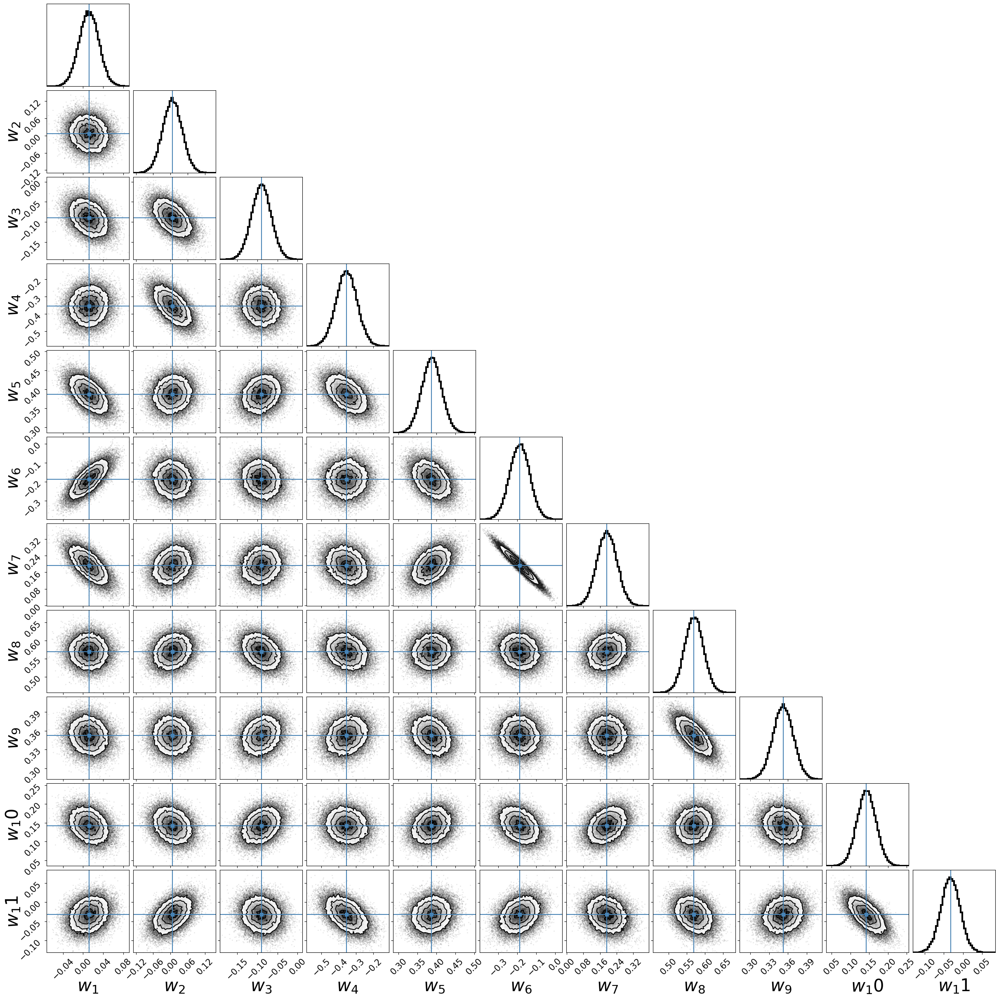

In [89]:
figure = corner.corner(samples_naive, bins=50, dpi=300, hist_kwargs={"linewidth": 3},labels=[f'$w_{i}$' for i in range(1,1+len(beta_naive))], truths=beta_naive,label_kwargs={"fontsize": 30})
# figure = corner.corner(samples_naive_space)

plt.show()

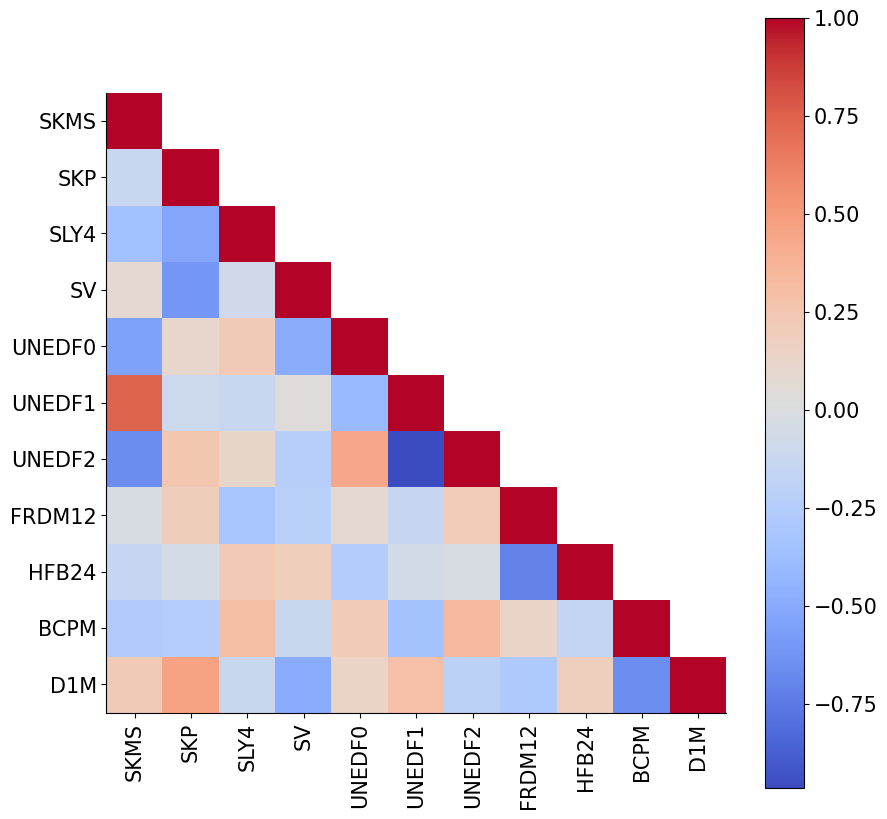

In [90]:
correlation_matrix_naive = cov_matrix_naive / np.sqrt(np.outer(np.diag(cov_matrix_naive), np.diag(cov_matrix_naive)))

mask = np.triu_indices_from(correlation_matrix_naive, k=1)
correlation_matrix_naive[mask] = np.nan

fig, ax = plt.subplots(figsize=(10, 10))

# Create the heatmap

# cax = ax.matshow(correlation_matrix_naive, cmap='coolwarm', vmin=0.99925, vmax=1)
cax = ax.matshow(correlation_matrix_naive, cmap='coolwarm')
# Add color bar
plt.colorbar(cax)

# Set axis labels
ax.set_xticks(np.arange(len(correlation_matrix_naive)))
ax.set_yticks(np.arange(len(correlation_matrix_naive)))

# plot_labels=[f"$w_{{{i}}}$" for i in range(1, len(correlation_matrix_naive) + 1)]
plot_labels=key_list
ax.set_xticklabels(plot_labels,rotation='vertical')
#   plt.xticks(labels,fontsize=10,rotation='vertical')
ax.set_yticklabels(plot_labels)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.xaxis.tick_bottom()

# Show the plot
plt.show()

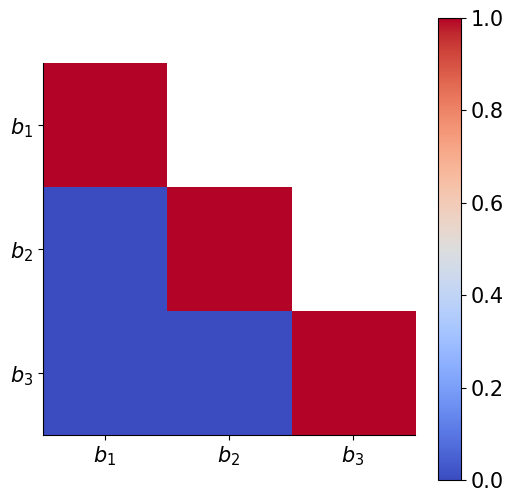

In [91]:
correlation_matrix = cov_matrix / np.sqrt(np.outer(np.diag(cov_matrix), np.diag(cov_matrix)))

mask = np.triu_indices_from(correlation_matrix, k=1)
correlation_matrix[mask] = np.nan

fig, ax = plt.subplots(figsize=(6, 6))

# Create the heatmap

# cax = ax.matshow(correlation_matrix, cmap='coolwarm', vmin=-1, vmax=1)
cax = ax.matshow(correlation_matrix, cmap='coolwarm')
# Add color bar
plt.colorbar(cax)

# Set axis labels
ax.set_xticks(np.arange(len(correlation_matrix)))
ax.set_yticks(np.arange(len(correlation_matrix)))

plot_labels=[f"$b_{i}$" for i in range(1, len(correlation_matrix) + 1)]

ax.set_xticklabels(plot_labels)
ax.set_yticklabels(plot_labels)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.xaxis.tick_bottom()

# Show the plot
plt.show()

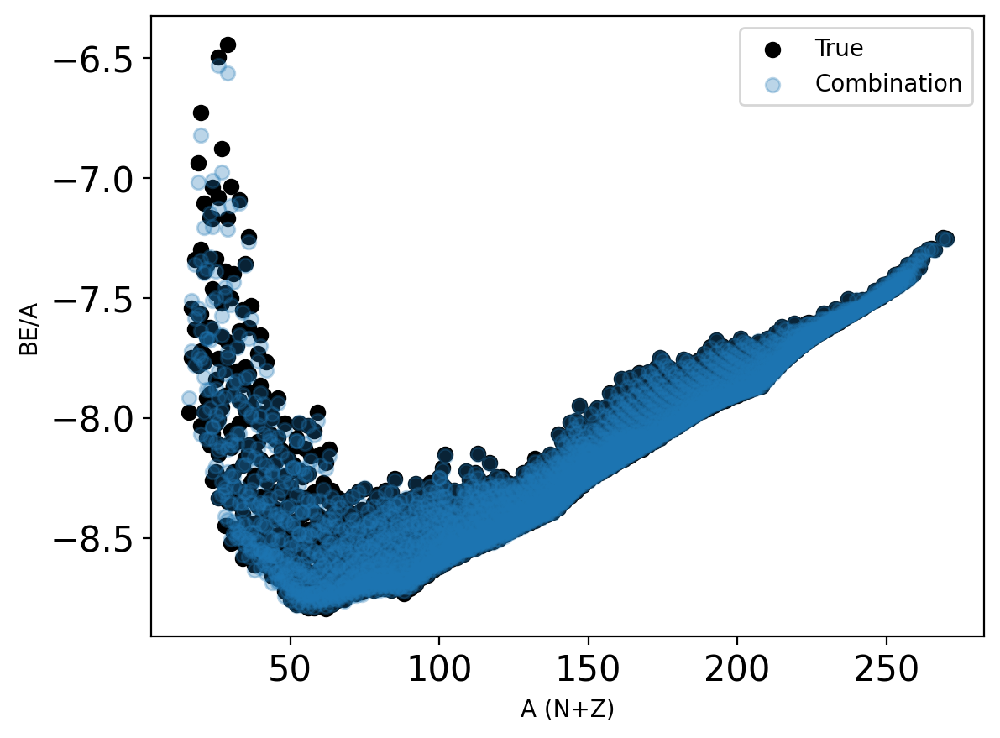

In [92]:
fig = plt.subplots(dpi=200)

plt.scatter(x = models_output["A"], y = models_output['truth'], label = str("True"), color='k')




plt.scatter(x = models_output["A"], y = supermodel_full, label = str("Combination"), alpha = 0.3)


plt.legend()

plt.xlabel('A (N+Z)')

plt.ylabel('BE/A')

plt.show()

In [93]:
#Restricting the super model to plot on the selected isotope 
X_full_filtered=[]

for i in range(len(X_full)):
    X_full_filtered.append(X_full[i][filtered_models_output.index])
X_full_filtered=np.array(X_full_filtered)

In [94]:
rng = np.random.default_rng()
theta_rand = rng.choice(samples, (50000), replace=False)
appropiate_sigma=sigma_squared

# theta_rand = rng.choice(met_res[0], (50000), replace=False)
# appropiate_sigma=emp_sigma**2

rndm_m = []

for i in range(len(theta_rand)):
    if centering_data:
        yvals_rand= X_full_filtered.T.dot(np.insert(theta_rand[i], 0, 1))
    else:
        yvals_rand= X_full_filtered.T.dot(theta_rand[i])

    rndm_m.append(yvals_rand +
                   np.random.multivariate_normal(np.full(
                       len(yvals_rand)
                       ,0), np.diag(1.0 * np.full(len(yvals_rand),1.0 * appropiate_sigma ) )))   

In [95]:
#Restricting the full naive model to the isotopes we want
model_predictions_filtered=[]

for i in range(len(model_predictions.T)):
    model_predictions_filtered.append(model_predictions.T[i][filtered_models_output.index])
model_predictions_filtered=np.array(model_predictions_filtered)

In [96]:
rndm_m_naive=[]

for i in range(len(samples_naive)):

    yvals_rand= model_predictions_filtered.T.dot(samples_naive[i])

    rndm_m_naive.append(yvals_rand +
                   np.random.multivariate_normal(np.full(
                       len(yvals_rand)
                       ,0), np.diag(1.0 * np.full(len(yvals_rand),1.0 * sigma_squared_naive ) )))   

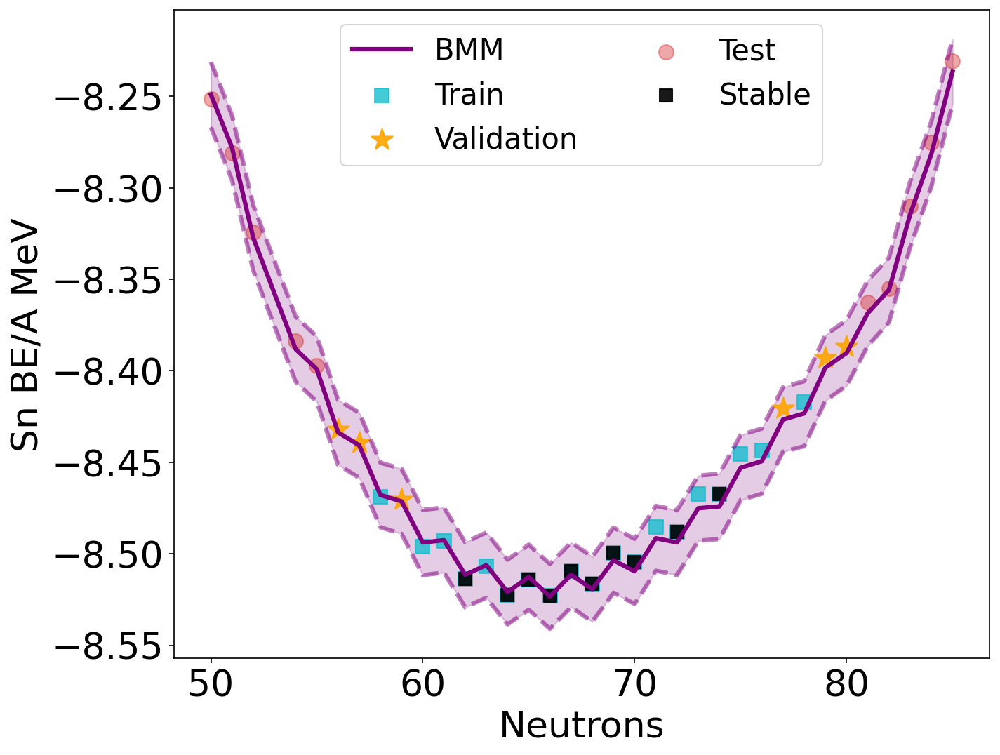

In [111]:
plt.rc("xtick", labelsize=25)
plt.rc("ytick", labelsize=25)

fig, ax = plt.subplots(figsize=(10,8), dpi=150)
# fig, ax = plt.subplots(dpi=200)

alpha_models=0.2

# model_index=0
# class_index=0
# for n_vals in n_classes:
#     legend_flag=0
#     for i in range(n_vals):
#         if legend_flag==0:
#             legend_flag=1
#             ax.plot(filtered_models_output["N"], filtered_models_output[key_list[model_index]], label = n_Labels[class_index], color=colors[class_index],alpha = alpha_models,linewidth=5)
           
#         else:
#             ax.plot(filtered_models_output["N"], filtered_models_output[key_list[model_index]], color=colors[class_index],alpha = alpha_models,linewidth=5)
#         model_index=model_index+1
#     class_index=class_index+1
#     legend_flag=0



#Select what to plot, either the super model or the naive version


name="BMM-PC"
samples_plot=np.copy(rndm_m)



# name="BMM-0"
# samples_plot=np.copy(rndm_m_naive)



mean = np.mean(samples_plot,axis=0)
upper = (np.percentile(samples_plot, 97.5, axis=0))

lower = (np.percentile(samples_plot, 2.5, axis=0))

plt.plot(filtered_models_output["N"], mean, color="purple", label='BMM',linewidth=3)

plt.plot(filtered_models_output["N"], lower, color="purple",linestyle="dashed",linewidth=3,alpha=0.5)
plt.plot(filtered_models_output["N"], upper, color="purple",linestyle="dashed",linewidth=3,alpha=0.5)

plt.fill_between(filtered_models_output["N"], lower, upper, color="purple",alpha=0.2)




# ax.scatter(x = filtered_models_output_train["N"], y = filtered_models_output_train['truth'], label = "Truth (Train)",color='k',s=200)

# ax.scatter(x = filtered_models_output_test["N"], y = filtered_models_output_test['truth'],
#             label = "Truth (Test)",color='orange',s=400,marker="*",edgecolor='face', linewidth=1.5,alpha=1)


# ax.scatter(x = filtered_models_output_test["N"], y = filtered_models_output_test['truth'],
#             label = "Truth (Test)",color='orange',s=400,marker="*",edgecolor='face', linewidth=1.5,alpha=1)


size_multiplyier=6

ax.scatter(x = filtered_models_output_train["N"], y = filtered_models_output_train['truth'], label = "Train",  alpha = alpha_trainig,color=color_trainig,s=size_trainig*size_multiplyier,marker=marker_trainig)

ax.scatter(x = filtered_models_output_validation["N"], y = filtered_models_output_validation['truth'], label = "Validation", alpha=alpha_validation ,color=color_validation,s=size_validation*size_multiplyier,marker=marker_validation)

ax.scatter(x = filtered_models_output_test["N"], y = filtered_models_output_test['truth'], label = "Test", alpha = alpha_testing,color=color_testing,s=size_testing*size_multiplyier,marker=marker_testing)

ax.scatter(x = filtered_models_output_stable["N"], y = filtered_models_output_stable['truth'], label = "Stable", alpha = 0.9,color='k',s=80,marker="s")





plt.xlabel("Neutrons",fontsize=25)
plt.ylabel(Selected_element_name+ " BE/A MeV",fontsize=25)
plt.legend(fontsize=20,markerscale=1,ncol=2 )

plt.show()

In [98]:
super_model_resituals_train=supermodel_train  -  models_output_train['truth'].tolist()
super_model_residuals_validation= supermodel_validation-models_output_validation['truth'].tolist()
super_model_residuals_test = supermodel_test-models_output_test['truth'].tolist()



naive_model_resituals_train=supermodel_train_naive-models_output_train['truth'].tolist()
naive_model_residuals_validation= supermodel_validation_naive-models_output_validation['truth'].tolist()
naive_model_residuals_test = supermodel_test_naive-models_output_test['truth'].tolist()





In [99]:
sigma_train=np.sqrt(np.sum(super_model_resituals_train**2) / len(super_model_resituals_train) )
sigma_validation=np.sqrt(np.sum(super_model_residuals_validation**2) / len(super_model_residuals_validation) )
sigma_test=np.sqrt(np.sum(super_model_residuals_test**2) / len(super_model_residuals_test) )


sigma_naive_train=np.sqrt(np.sum(naive_model_resituals_train**2) / len(naive_model_resituals_train) )
sigma_naive_validation=np.sqrt(np.sum(naive_model_residuals_validation**2) / len(naive_model_residuals_validation) )
sigma_naive_test=np.sqrt(np.sum(naive_model_residuals_test**2) / len(naive_model_residuals_test) )



In [100]:
[sigma_train,sigma_validation,sigma_test]

[0.009061450642956492, 0.013349375219446895, 0.010558588434477769]

In [101]:
[sigma_naive_train,sigma_naive_validation,sigma_naive_test]

[0.008284687168410989, 0.01226431085061195, 0.008980586240352695]

In [102]:
key_list

['SKMS',
 'SKP',
 'SLY4',
 'SV',
 'UNEDF0',
 'UNEDF1',
 'UNEDF2',
 'FRDM12',
 'HFB24',
 'BCPM',
 'D1M']

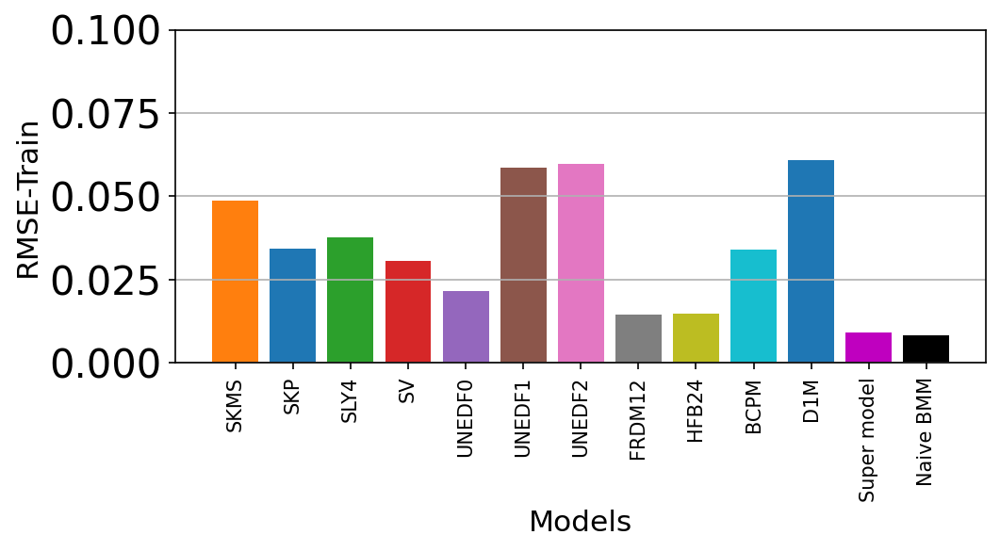

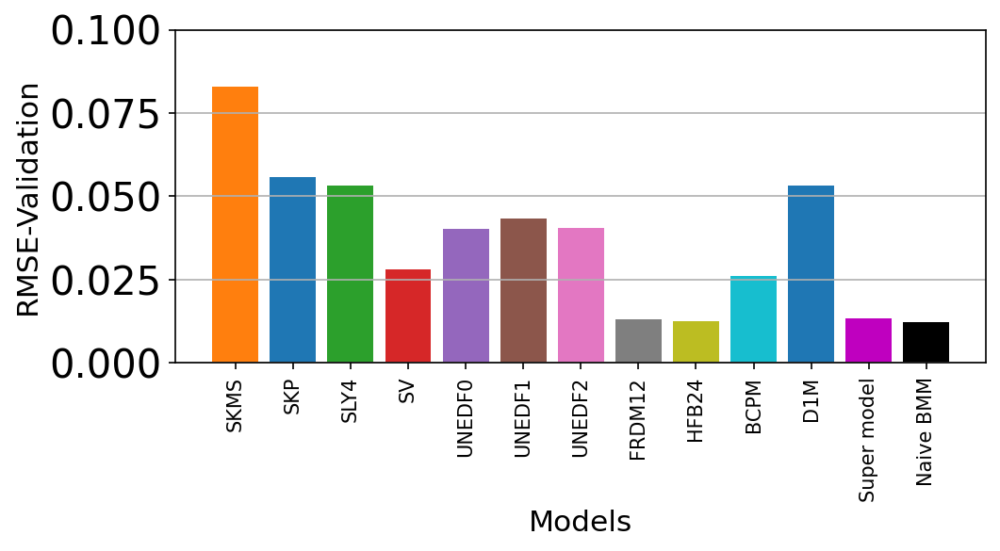

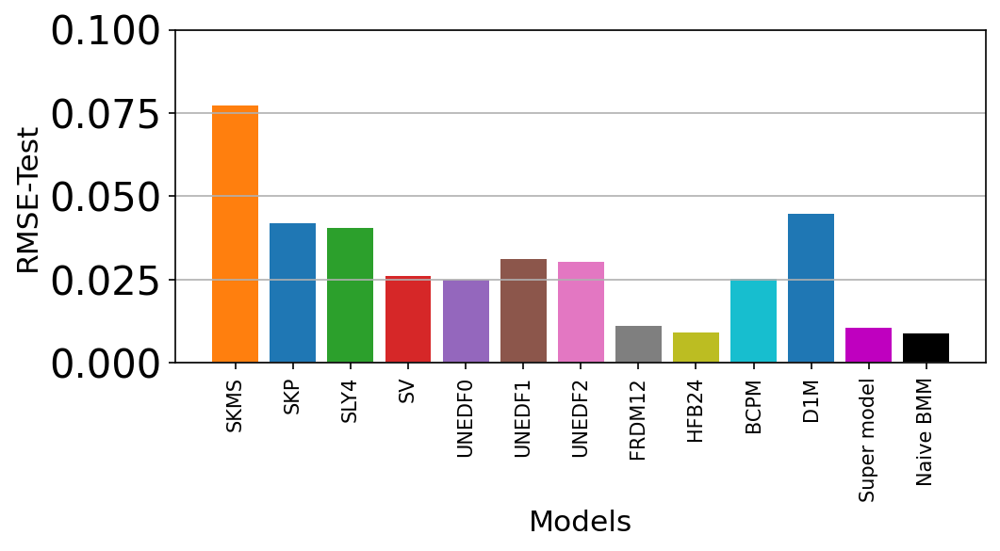

In [103]:
y_max=0.1

plt.rc("xtick", labelsize=20)
plt.rc("ytick", labelsize=20)


################################

# Training round


    # visited_model=0
    # for model in key_list:
    #     ax.arrow(0, 0, Vt_hat_normalized.T[visited_model][1],Vt_hat_normalized.T[visited_model][2], 
    #             head_width=0.02, head_length=0.05, fc=colors[visited_model], ec=colors[visited_model],label=model)

    #     visited_model=visited_model+1





labels=key_list
plt.figure(figsize=(7, 4),dpi=150)


visited_model=0
for model in key_list:


    plt.bar(model, model_summary["rmse_train"][visited_model], color=colors[visited_model])
    visited_model=visited_model+1  


plt.bar('Super model' , sigma_train, color='m')
plt.bar('Naive BMM' , sigma_naive_train, color='k')

plt.xlabel('Models',fontsize=15)
plt.ylabel('RMSE-Train',fontsize=15)
plt.ylim(0,y_max)
plt.xticks(fontsize=10,rotation='vertical')
plt.grid(axis='y')
plt.tight_layout()
plt.show()

################################

# Validation round

plt.figure(figsize=(7, 4),dpi=150)

visited_model=0
for model in key_list:


    plt.bar(model, model_summary["rmse_validation"][visited_model], color=colors[visited_model])
    visited_model=visited_model+1  



plt.bar('Super model' , sigma_validation, color='m')

plt.bar('Naive BMM' , sigma_naive_validation, color='k')

plt.xlabel('Models',fontsize=15)
plt.ylabel('RMSE-Validation',fontsize=15)
plt.ylim(0,y_max)
plt.xticks(fontsize=10,rotation='vertical')
plt.grid(axis='y')
plt.tight_layout()
plt.show()

################################

# Testing round


plt.figure(figsize=(7, 4),dpi=150)
visited_model=0
for model in key_list:


    plt.bar(model, model_summary["rmse_test"][visited_model], color=colors[visited_model])
    visited_model=visited_model+1  





plt.bar('Super model' , sigma_test, color='m')
plt.bar('Naive BMM' , sigma_naive_test, color='k')

plt.xlabel('Models',fontsize=15)
plt.ylabel('RMSE-Test',fontsize=15)
plt.ylim(0,y_max)
plt.xticks(fontsize=10,rotation='vertical')
plt.grid(axis='y')
plt.tight_layout()
plt.show()

################################

# Everything round

In [104]:
centering_data

True

In [105]:
def PC_RMSE_calculator(components_kept):  #A function that will basically run everything above (without the plots) with varying number of kept PCs




    S_hat=np.array([S[i] for i in range(components_kept)])

    # U_hat=np.array([U.T[i]*S_hat[i] for i in range(components_kept)])
    U_hat=np.array([U.T[i]*np.linalg.norm(predictions_train_mean) for i in range(components_kept)])

    # Vt_hat=np.array([Vt[i] for i in range(components_kept)])
    Vt_hat=np.array([Vt[i]/S_hat[i]*np.linalg.norm(predictions_train_mean) for i in range(components_kept)])   


    if centering_data:
        num_components=components_kept+1
    else:
        num_components=components_kept



    #########################################
    #Creating principal components that are for training. These should be equivalent to \hat U, and if they are not there is something wrong
    models_PC_train = {}
    if centering_data:
        models_PC_train[str("PC_0")] = predictions_train_mean       
    for i in range(components_kept):
        models_PC_train[str("PC_")+str(i+1)] = np.dot(Vt_hat[i],model_predictions_train.T)
    models_PC_train["N"] = models_output_train["N"]
    models_PC_train["Z"] = models_output_train["Z"]
    models_PC_train["A"] = models_PC_train["N"] + models_PC_train["Z"]
    models_PC_training = pd.DataFrame(models_PC_train)
    #########################################

    #########################################
    #Creating principal components that are for validation
    models_PC_validation = {}
    if centering_data:
        models_PC_validation[str("PC_0")] = predictions_validation_mean
    for i in range(components_kept):
        models_PC_validation[str("PC_")+str(i+1)] = np.dot(Vt_hat[i],model_predictions_validation.T)
    models_PC_validation["N"] = models_output_validation["N"]
    models_PC_validation["Z"] = models_output_validation["Z"]
    models_PC_validation["A"] = models_PC_validation["N"] + models_PC_validation["Z"]
    models_PC_validation = pd.DataFrame(models_PC_validation)
    #########################################

    #########################################
    #Creating principal components that are for testing
    models_PC_testing = {}
    if centering_data:
        models_PC_testing[str("PC_0")] = predictions_test_mean
    for i in range(components_kept):
        # models_PC_testing[str("PC_")+str(i+1)] = np.dot(Vt_hat[i],model_predictions_test.T)*S_hat[i]
        models_PC_testing[str("PC_")+str(i+1)] = np.dot(Vt_hat[i],model_predictions_test.T)

    models_PC_testing["N"] = models_output_test["N"]
    models_PC_testing["Z"] = models_output_test["Z"]
    models_PC_testing["A"] = models_PC_testing["N"] + models_PC_testing["Z"]
    models_PC_testing = pd.DataFrame(models_PC_testing)
    #########################################

    #Creating principal components that are valid everywhere (testing + training + validation)
    models_PC = {}
    if centering_data:
        models_PC[str("PC_0")] = predictions_mean
    for i in range(components_kept):
        models_PC[str("PC_")+str(i+1)] = np.dot(Vt_hat[i],model_predictions.T)
    models_PC = pd.DataFrame(models_PC)
    models_PC["N"] = filtered_NZ.T[0]
    models_PC["Z"] = filtered_NZ.T[1]
    models_PC["A"] = models_PC["N"] + models_PC["Z"]
    #########################################

    key_list_PCs=list(models_PC_testing.keys())


    X=np.copy(U_hat)
    if centering_data:
        y=np.copy(models_output_train["truth"].tolist())-predictions_train_mean
    else:
        y=np.copy(models_output_train["truth"].tolist())
    #Making the list of principal components across the train part. These should be identical to the X on top made by \hat U
    X_train=[]
    for i in range(num_components):
        X_train.append(models_PC_train[key_list_PCs[i]].tolist())
    X_train=np.array(X_train)
    #Making the list of principal components across the validation part
    X_validation=[]
    for i in range(num_components):
        X_validation.append(models_PC_validation[key_list_PCs[i]].tolist())
    X_validation=np.array(X_validation)

    #Making the list of principal components across the testing part
    X_test=[]
    for i in range(num_components):
        X_test.append(models_PC_testing[key_list_PCs[i]].tolist())
    X_test=np.array(X_test)
    #Making the list of principal components across the entire chart (training+validation+testing)
    X_full=[]
    for i in range(num_components):
        X_full.append(models_PC[key_list_PCs[i]].tolist())
    X_full=np.array(X_full)

    

    # 1) Find the least square solution for the training part
    X_T_X_inv = np.linalg.inv(X.dot(X.T))
    beta = X_T_X_inv.dot(X).dot(y)
    
    #1.5) Construct the super model across the entire range and the test range
    if centering_data:
        beta_full= np.insert(beta, 0, 1)  #Augmenting the beta list to add a "1" at the begining so it can use the PC0 (the mean)
    else:
        beta_full=np.copy(beta)

    # supermodel=X.T.dot(beta_full)
    supermodel=X_train.T.dot(beta_full)
    supermodel_train=np.copy(supermodel)
    supermodel_validation=X_validation.T.dot(beta_full)
    supermodel_test=X_test.T.dot(beta_full)
    supermodel_full=X_full.T.dot(beta_full)

    
    super_model_resituals_train=supermodel_train-models_output_train['truth'].tolist()
    super_model_residuals_validation= supermodel_validation-models_output_validation['truth'].tolist()
    super_model_residuals_test = supermodel_test-models_output_test['truth'].tolist()
    super_model_residuals_full = supermodel_full-models_output['truth'].tolist()

    sigma_train=np.sqrt(np.sum(super_model_resituals_train**2) / len(super_model_resituals_train) )
    sigma_validation=np.sqrt(np.sum(super_model_residuals_validation**2) / len(super_model_residuals_validation) )
    sigma_test=np.sqrt(np.sum(super_model_residuals_test**2) / len(super_model_residuals_test) )
    sigma_full=np.sqrt(np.sum(super_model_residuals_full**2) / len(super_model_residuals_full) )


    return [sigma_train,sigma_validation,sigma_test,sigma_full]

In [109]:
if centering_data:
    s_validation=[np.linalg.norm(np.array(models_output_validation["truth"].tolist())-predictions_validation_mean)/np.sqrt(len(predictions_validation_mean))]
    s_test=[np.linalg.norm(np.array(models_output_test["truth"].tolist())-predictions_test_mean)/np.sqrt(len(predictions_test_mean))]
    s_train=[np.linalg.norm(np.array(models_output_train["truth"].tolist())-predictions_train_mean)/np.sqrt(len(predictions_train_mean))]
    s_all=[np.linalg.norm(np.array(models_output["truth"].tolist())-predictions_mean)/np.sqrt(len(predictions_mean))]
    
else:
    s_test=[]
    s_train=[]
    s_validation=[]
    s_all=[]

if centering_data:
    for i in range(1,len(S)):
        res=PC_RMSE_calculator(i)
        s_train.append(res[0])
        s_validation.append(res[1])
        s_test.append(res[2])
        
        s_all.append(res[3])
else:
    for i in range(1,len(S)+1):
        res=PC_RMSE_calculator(i)
        s_train.append(res[0])
        s_validation.append(res[1])
        s_test.append(res[2])
        
        s_all.append(res[3])

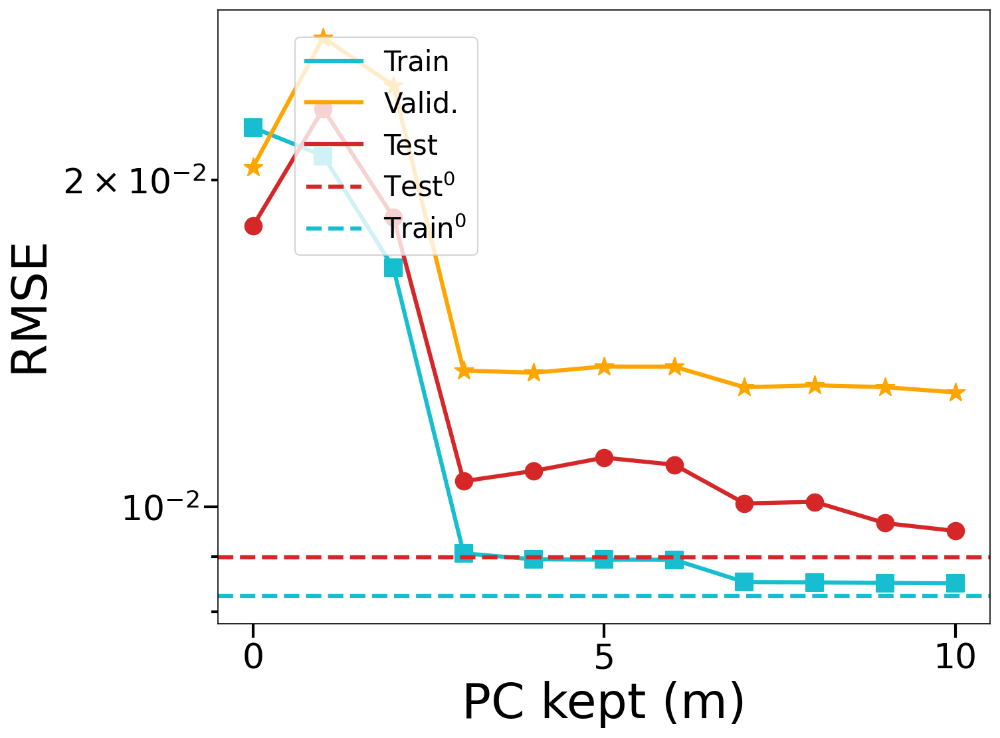

In [112]:
# plt.rc("xtick", labelsize=30)
# plt.rc("ytick", labelsize=30)


fig, ax = plt.subplots(figsize=(10,8),dpi=150)
fig.patch.set_facecolor('white')


# color_trainig=colors[9]
# color_validation='orange'
# color_testing=colors[3]

# marker_trainig='s'
# marker_validation='*'
# marker_testing='o'



# size_trainig=30
# size_validation=80
# size_testing=35

# alpha_trainig=0.8
# alpha_validation=0.9
# alpha_testing=0.4



size_points=150



ax.scatter(np.arange(0,len(s_train)), s_train,color=color_trainig,s=size_points,marker=marker_trainig)
ax.plot(np.arange(0,len(s_train)), s_train,color=color_trainig,linewidth=3,label="Train")

ax.scatter(np.arange(0,len(s_validation)), s_validation,color=color_validation,s=size_points*1.3,marker=marker_validation)
ax.plot(np.arange(0,len(s_validation)), s_validation,color=color_validation,linewidth=3,label="Valid.")


ax.scatter(np.arange(0,len(s_test)), s_test,color=color_testing,s=size_points,marker=marker_testing)
ax.plot(np.arange(0,len(s_test)), s_test,color=color_testing,linewidth=3,label="Test")

# ax.scatter(np.arange(1,len(s_all)+1), s_all,color='k',s=90,marker="s")
# ax.plot(np.arange(1,len(s_all)+1), s_all,color='k',linewidth=3,label="All",linestyle='dashed')

ax.axhline(y=sigma_naive_test,color=color_testing,label="Test$^0$",linestyle='dashed',linewidth=3)

ax.axhline(y=sigma_naive_train,color=color_trainig,label=f"Train$^0$",linestyle='dashed',linewidth=3)


ax.set_yscale('log')
ax.set_xlabel(r'PC kept (m)',fontsize=35)
ax.set_ylabel(r' RMSE',fontsize=35);
ax.set_xticks([0,5,10])
# ax.set_yticks()
# plt.ylim(1.7*10**(-2),1)

# plt.title("Singular values decay",fontsize=30)

plt.tick_params(axis='both',       
            which='major',      
            length=10,        
            width=2)

plt.tick_params(axis='both',       
            which='minor',      
            length=5,        
            width=2) 

# plt.annotate(f'$5 x 10^{{-1}}$', xy=(-0.12,1), xycoords='axes fraction',
#              ha='center', va='top', fontsize=30) 

# plt.annotate(f'$2 x 10^{{-2}}$', xy=(-0.12,0.1), xycoords='axes fraction',
#              ha='center', va='top', fontsize=30) 



plt.legend(fontsize=20,loc=(0.1,0.6))
plt.show()